# Imports

In [1]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [3]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"
matplotlib.rcParams["figure.facecolor"] = "white"

import numpy as np
np.set_printoptions(suppress=True)
import pandas as pd
from astropy.io import fits
from scipy.interpolate import interp1d

import lsst.daf.persistence as dafPersist
butler = dafPersist.Butler('/projects/HSC/PFS/Subaru/rerun/ncaplar/detrend_Jun_Sub/')

import Zernike_Module
from Zernike_Module import *
from Zernike_Analysis_Module import create_res_data

from pfs.drp.stella.images import calculateCentroid

import galsim

/tmp/ipykernel_256139/3610058931.py:2: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


lsst.CameraMapper INFO: Loading exposure registry from /tigress/HSC/PFS/Subaru/registry.sqlite3


# DCB & PFI images

In [4]:
ims = np.load('ims.npy', allow_pickle=True)

single_number: 2


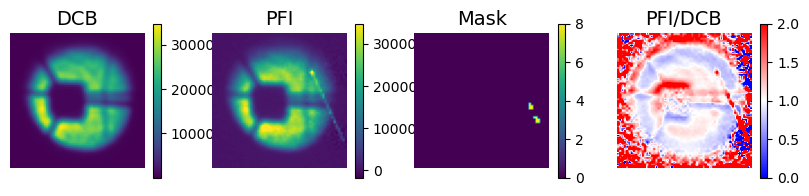

single_number: 5


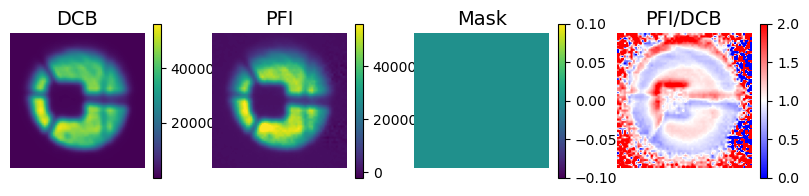

single_number: 6


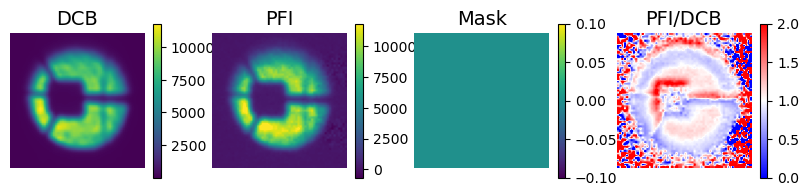

single_number: 11


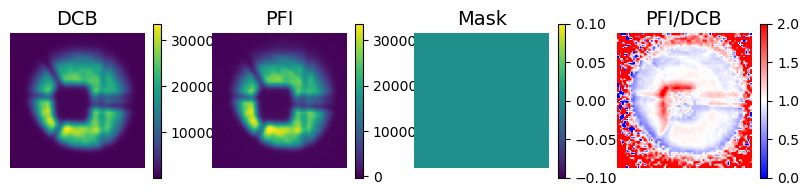

single_number: 14


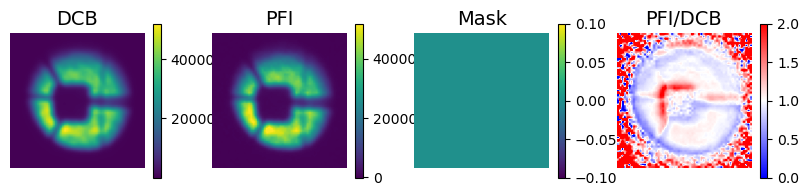

single_number: 15


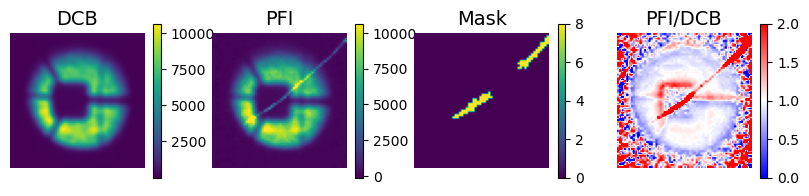

single_number: 20


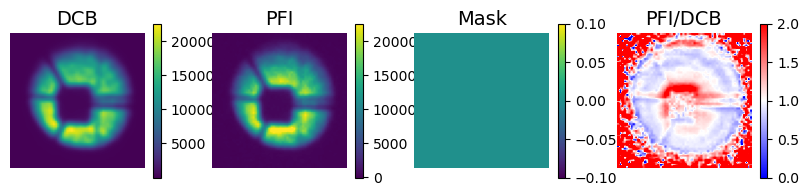

single_number: 23


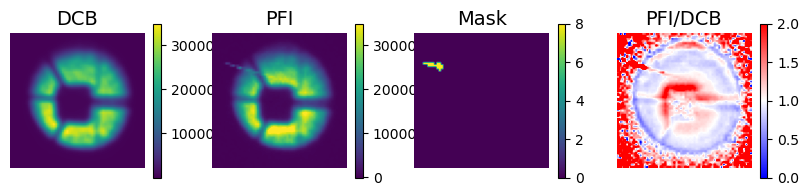

single_number: 24


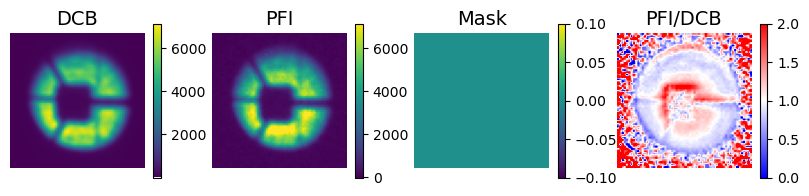

single_number: 25


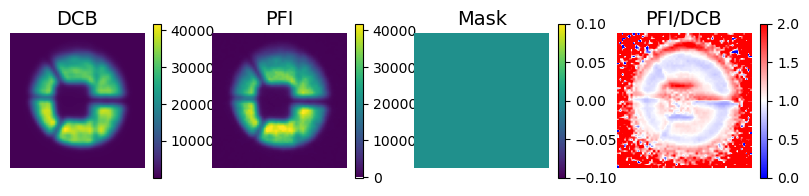

single_number: 29


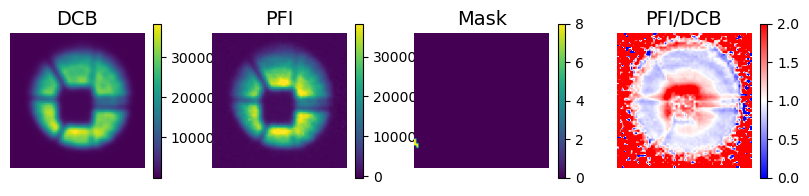

single_number: 32


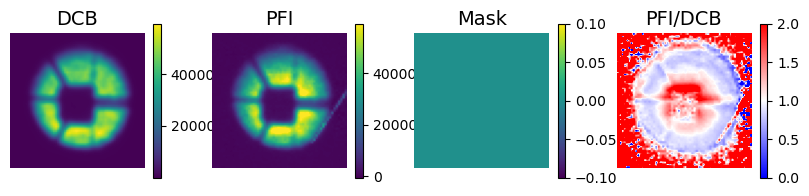

single_number: 33


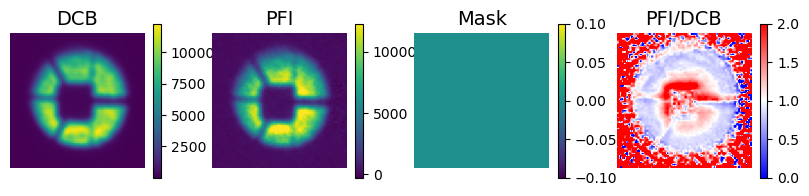

single_number: 38


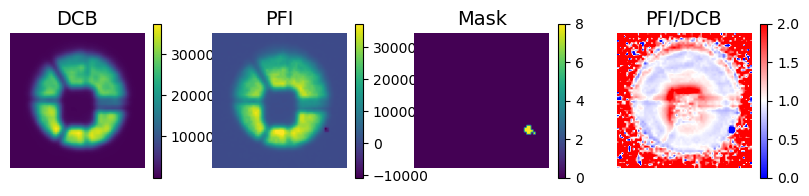

single_number: 41


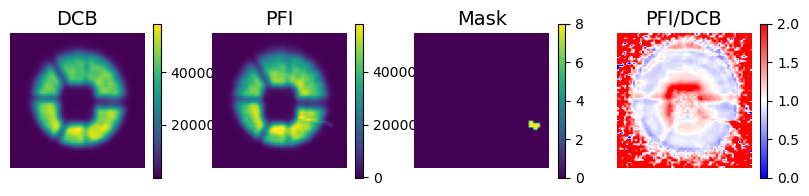

single_number: 42


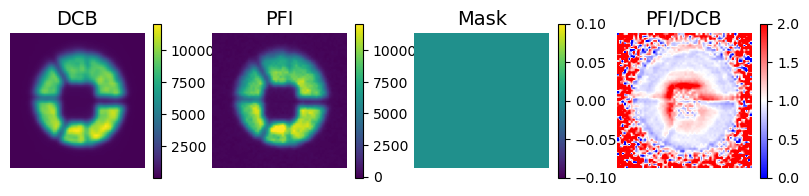

single_number: 47


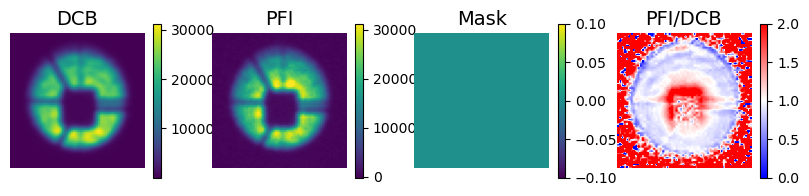

single_number: 50


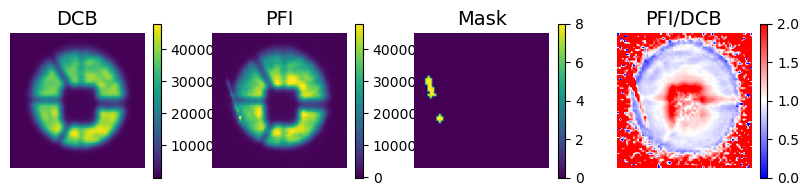

single_number: 51


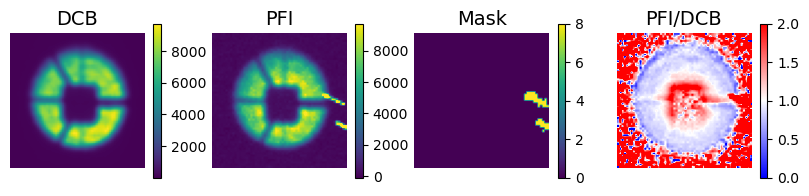

single_number: 56


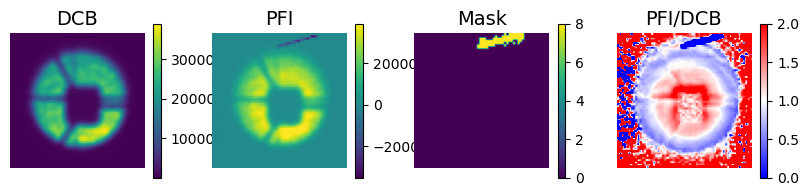

single_number: 59


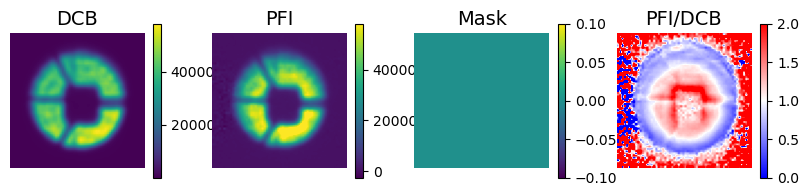

single_number: 60


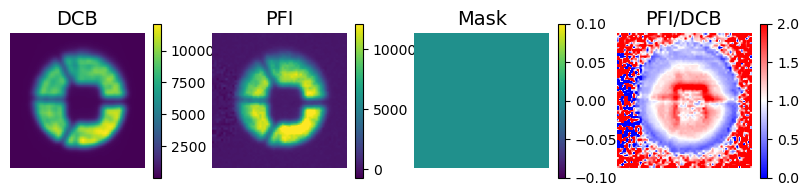

single_number: 65


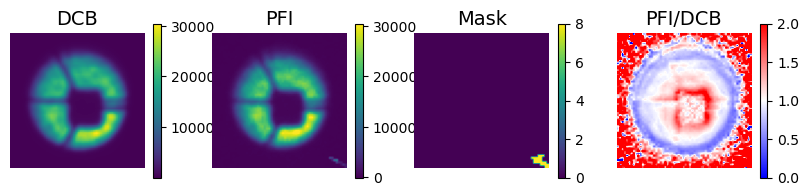

single_number: 68


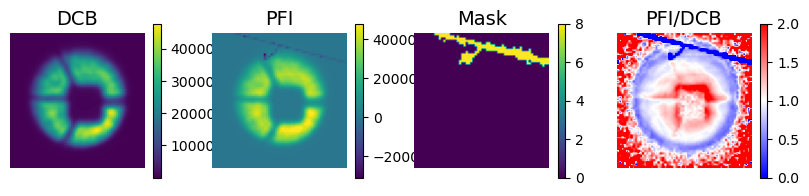

single_number: 69


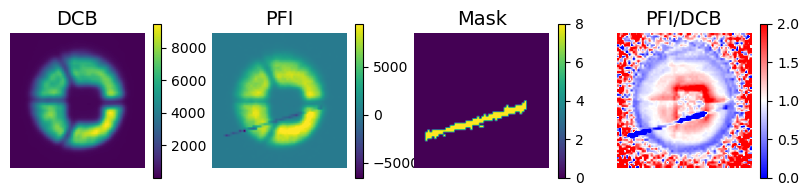

single_number: 74


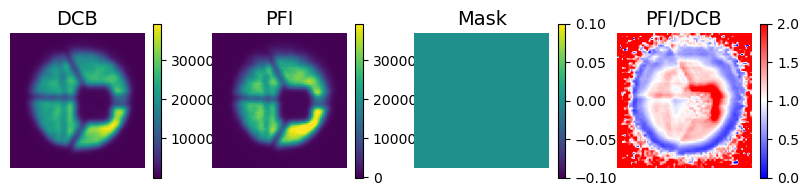

single_number: 77


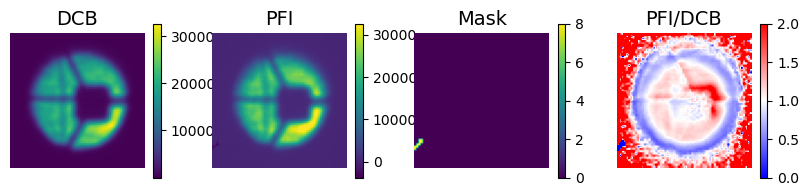

single_number: 78


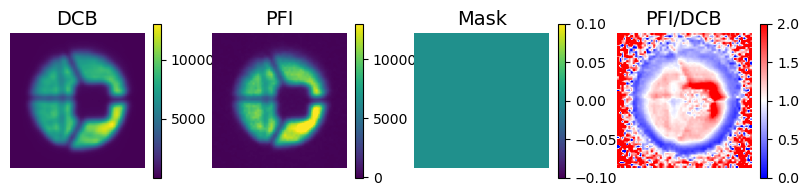

single_number: 79


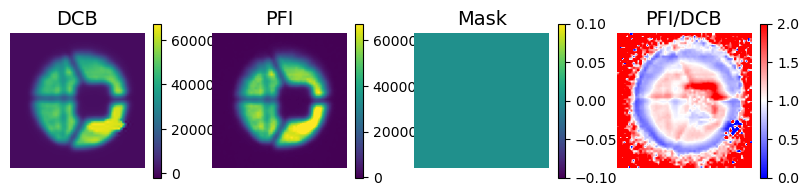

single_number: 83


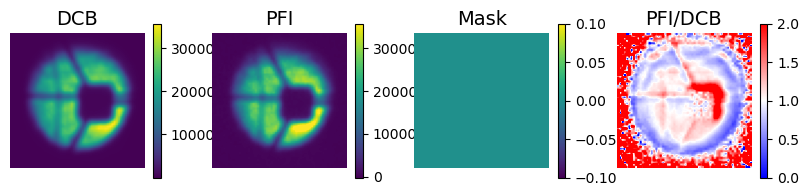

single_number: 86


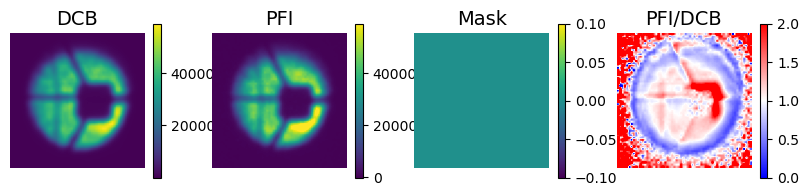

single_number: 87


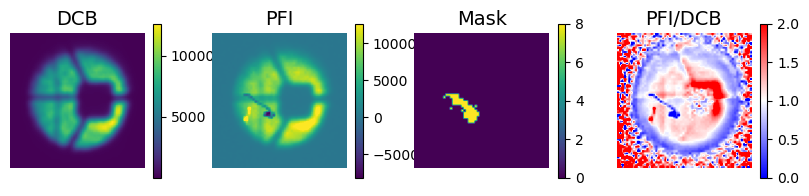

single_number: 101


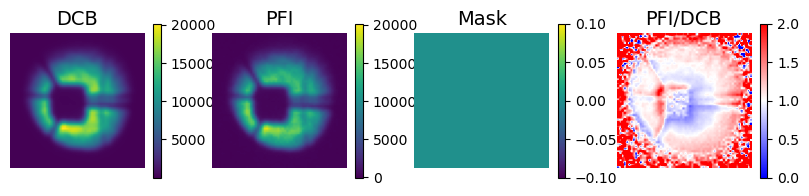

single_number: 104


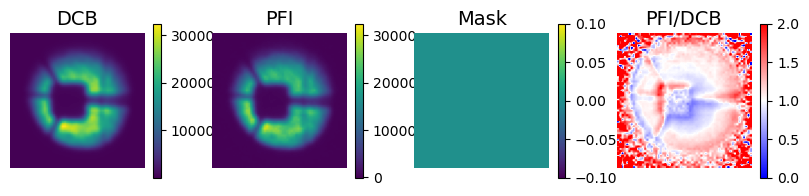

single_number: 105


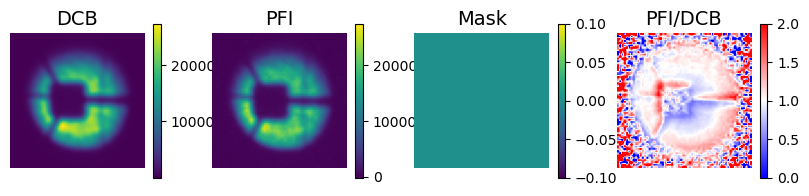

single_number: 106


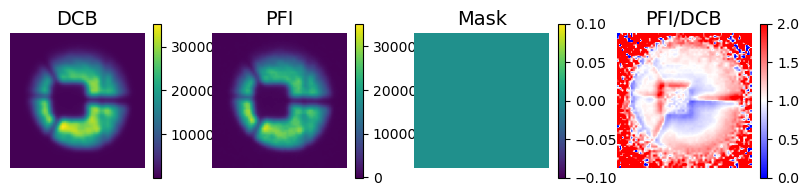

single_number: 119


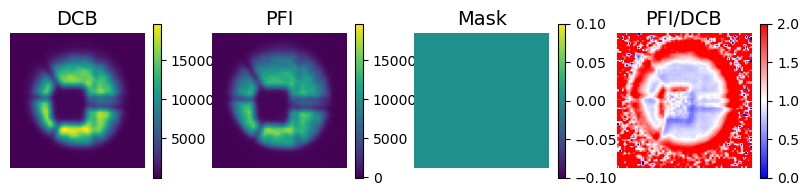

single_number: 122


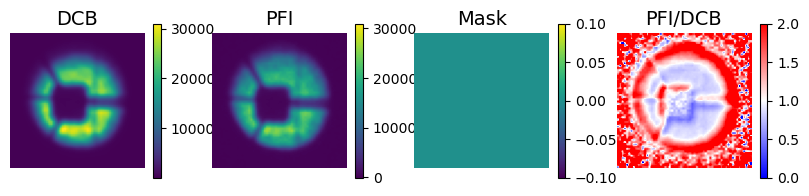

single_number: 123


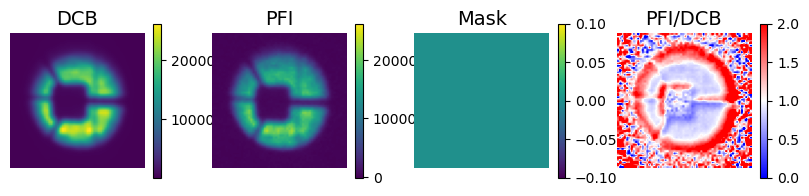

single_number: 124


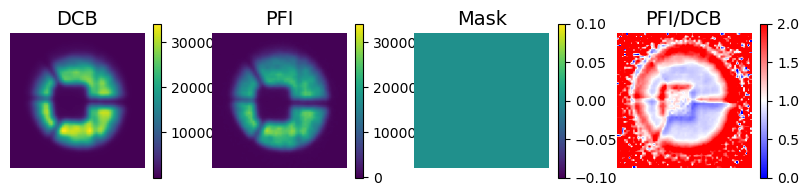

single_number: 137


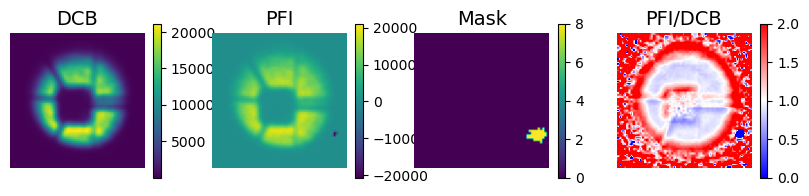

single_number: 140


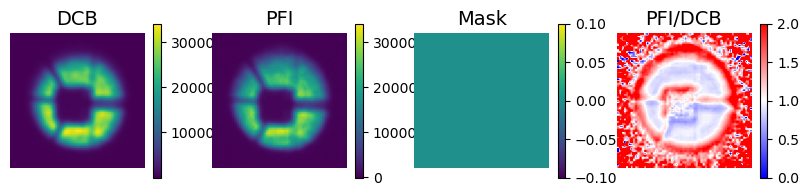

single_number: 141


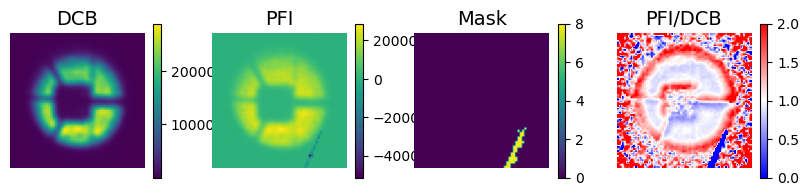

single_number: 142


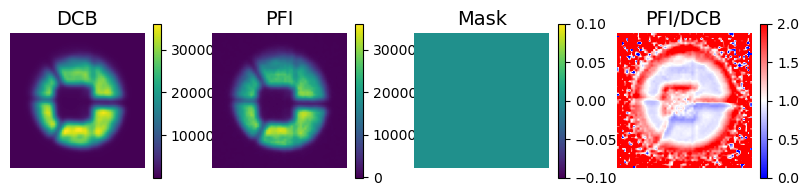

single_number: 146


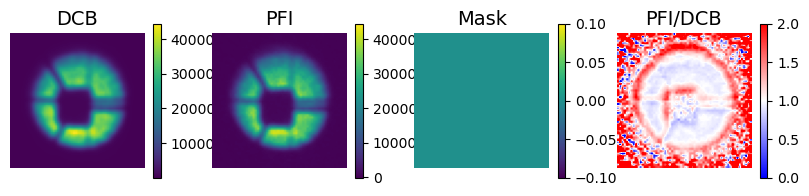

single_number: 149


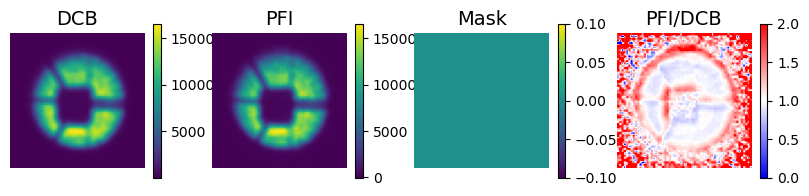

single_number: 150


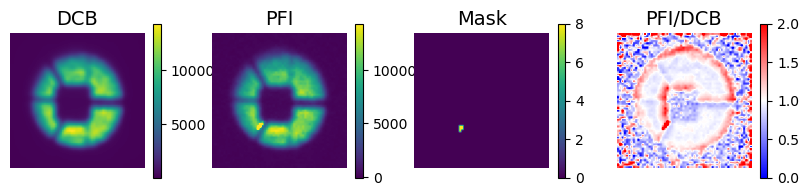

single_number: 151


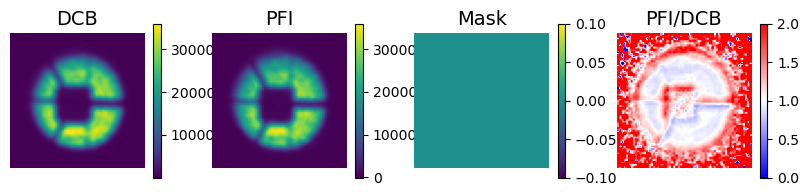

single_number: 155


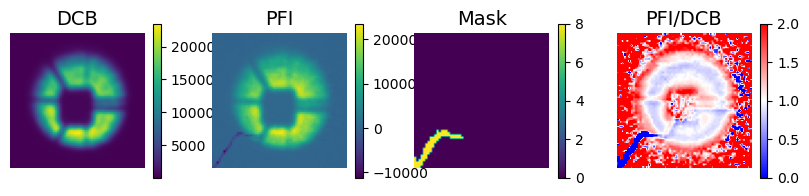

single_number: 158


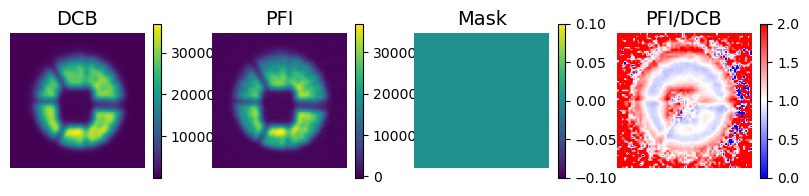

single_number: 159


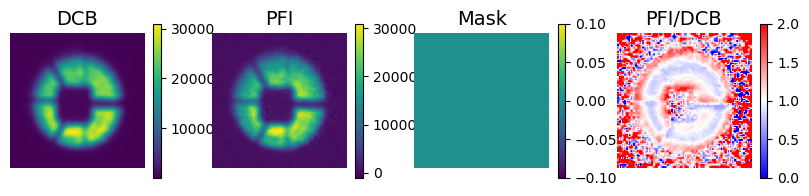

single_number: 160


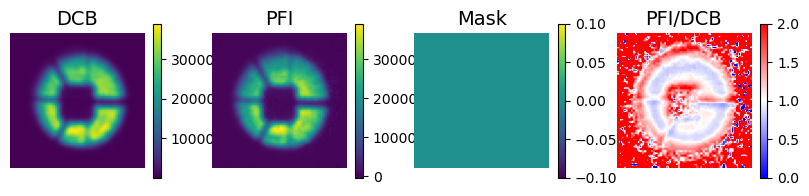

single_number: 173


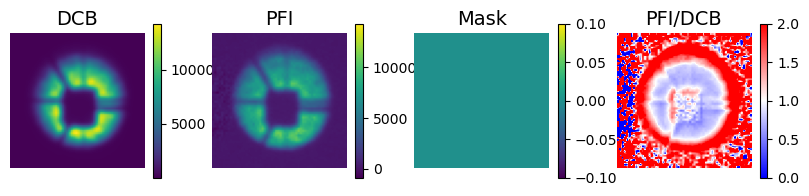

single_number: 176


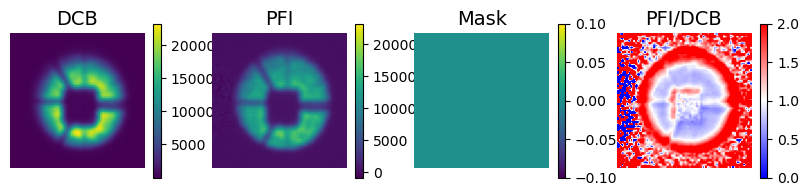

single_number: 177


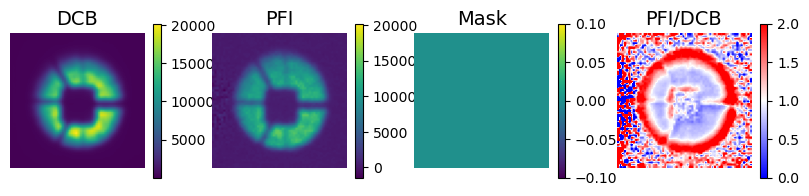

single_number: 178


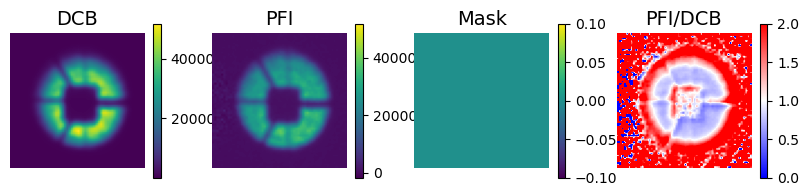

single_number: 191


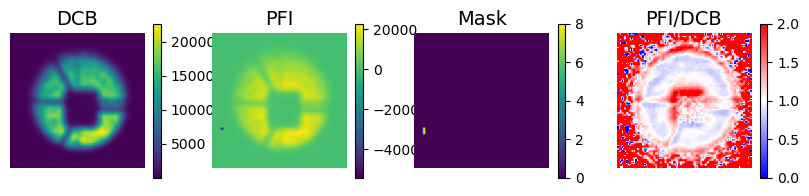

single_number: 194


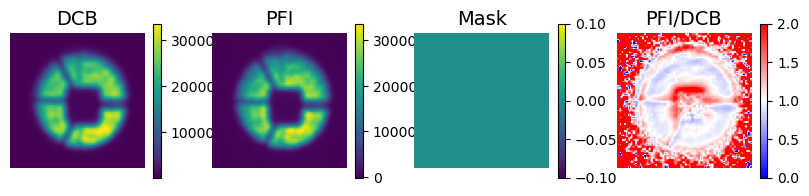

single_number: 195


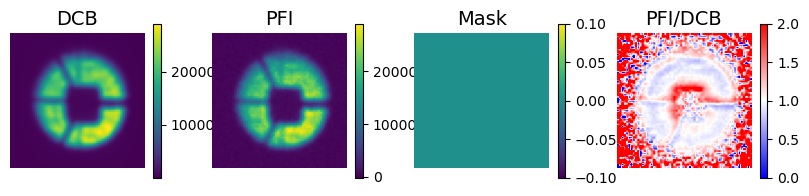

single_number: 196


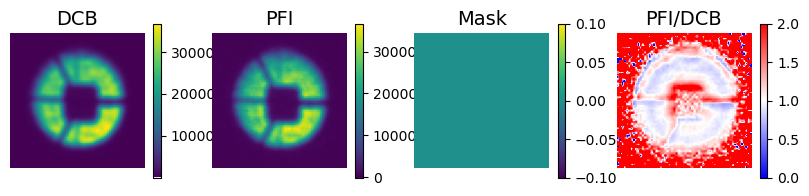

single_number: 209


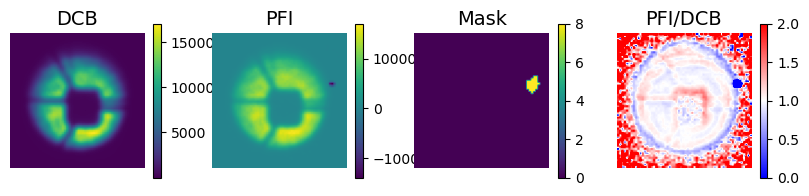

single_number: 212


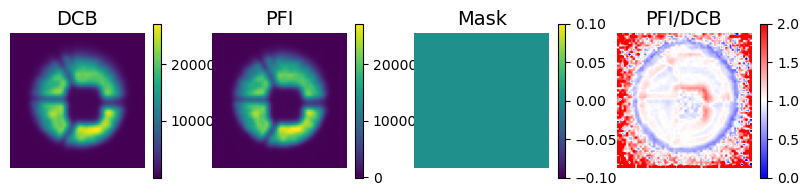

single_number: 213


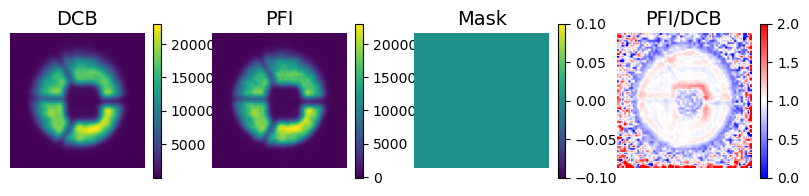

single_number: 214


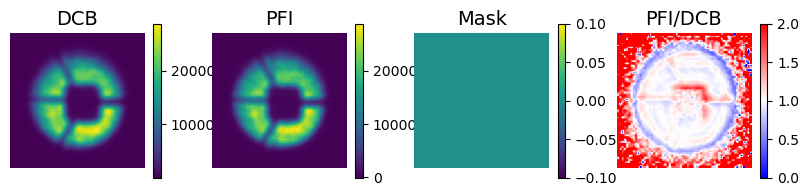

single_number: 218


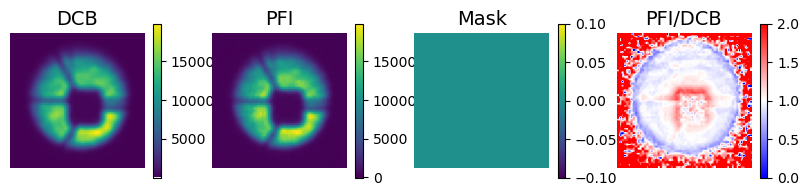

single_number: 221


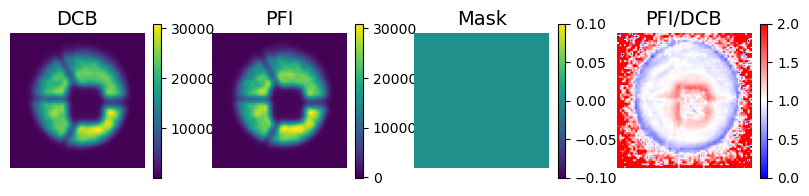

single_number: 222


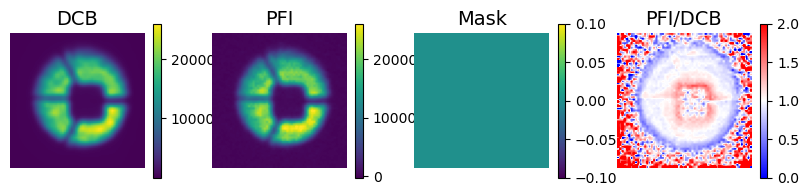

single_number: 223


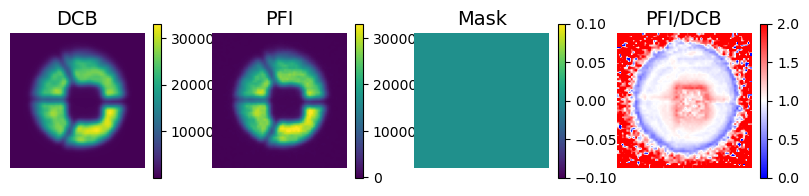

single_number: 227


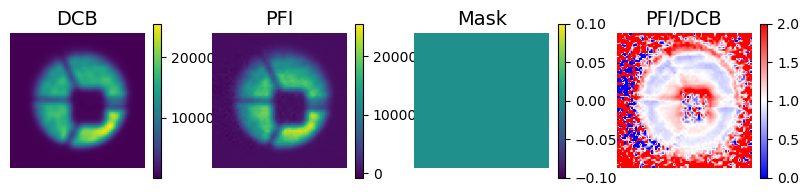

single_number: 230


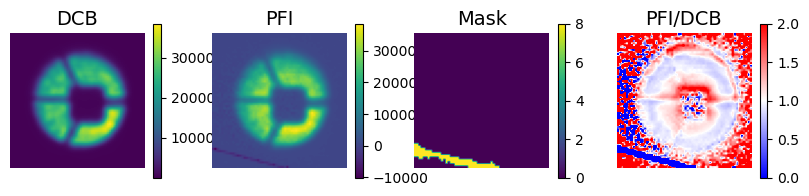

single_number: 231


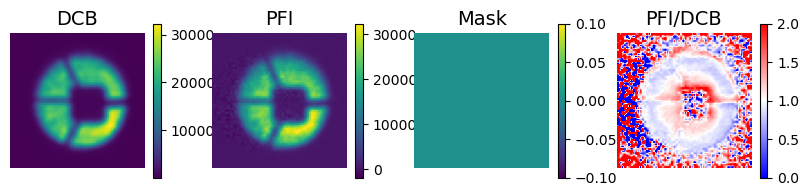

single_number: 232


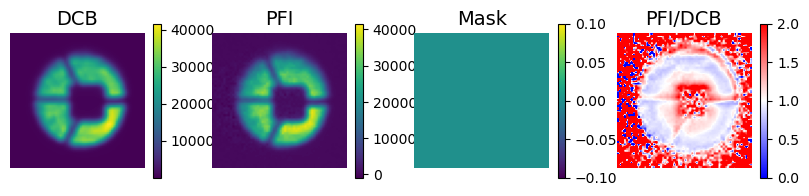

single_number: 263


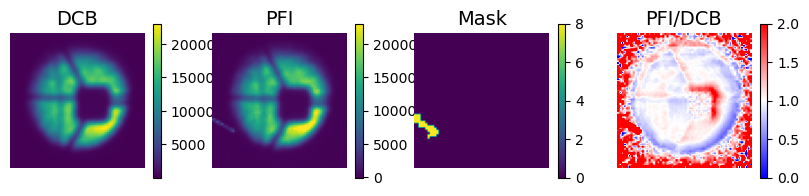

single_number: 266


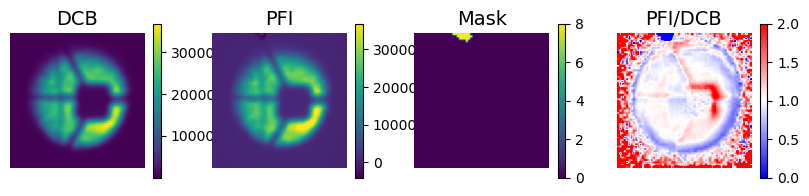

single_number: 267


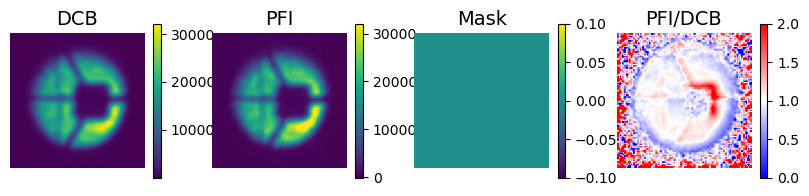

single_number: 268


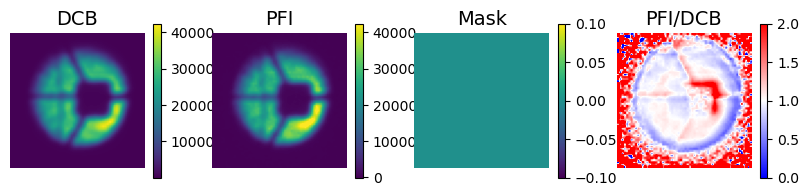

single_number: 272


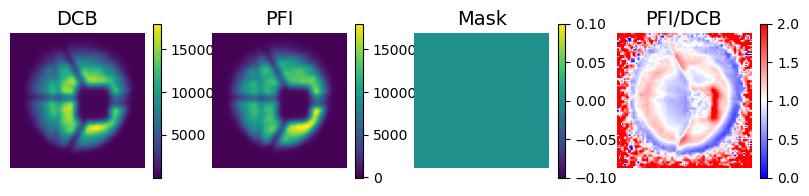

single_number: 275


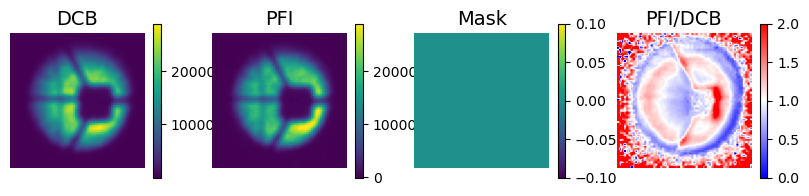

single_number: 276


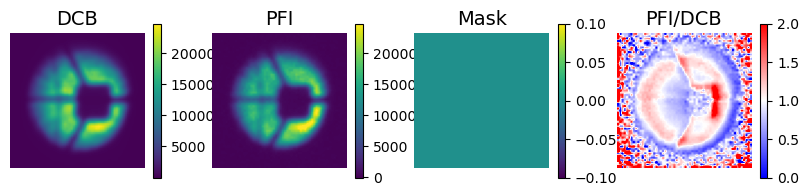

single_number: 277


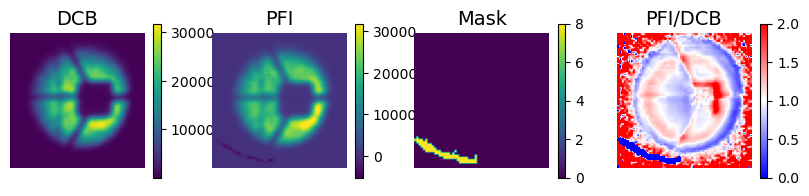

In [6]:
for single_number in ims[:,0]:
    print('single_number:', single_number)
    index = int(np.where(ims[:,0] == single_number)[0])
    
    #print('DCB center: ', centeroid_mask(ims[index][1], ~(ims[index][3]).astype(bool)))
    #print('PFI center: ', centeroid_mask(ims[index][2], ~(ims[index][3]).astype(bool)))
    
    plt.figure(figsize=(10,2))
    
    plt.subplot(141)
    plt.imshow(ims[index][1], origin='lower', vmax=np.max(ims[index, 1]))
    plt.title('DCB', fontsize=14)
    plt.axis('off')
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=10)
    
    plt.subplot(142)
    plt.imshow(ims[index][2], origin='lower', vmax=np.max(ims[index, 1]))
    plt.title('PFI', fontsize=14)
    plt.axis('off')
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=10)
    
    plt.subplot(143)
    plt.imshow(ims[index][3], origin='lower')
    plt.title('Mask', fontsize=14)
    plt.axis('off')
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=10)
    
    plt.subplot(144)
    plt.imshow(ims[index][4], origin='lower', cmap='bwr', vmax=2, vmin=0)
    plt.title('PFI/DCB', fontsize=14)
    plt.axis('off')
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=10)
    
    plt.show()

# Matching positions of detectors by 1d cut

In [11]:
ims_det_pos = np.load('ims_det_pos.npy')

In [25]:
# mean first or subtraction first?
offsets_ = np.load('offsets_.npy')
dec = 12
print(np.all(np.around(offsets_, decimals=dec) == np.around(offsets, decimals=dec)))
print(np.all(np.around(offsets_, decimals=dec+1) == np.around(offsets, decimals=dec+1)))

True
False


single_number = 2
iteration = 1
offset(DCB-PFI) =  [0.061, 0.624]
iteration = 2
offset(DCB-PFI) =  [-0.2265, -0.006]
iteration = 3
offset(DCB-PFI) =  [-0.005, 0.0155]
iteration = 4
offset(DCB-PFI) =  [-0.017, 0.002]
iteration = 5
offset(DCB-PFI) =  [-0.0115, 0.002]
iteration = 6
offset(DCB-PFI) =  [-0.011, 0.0015]


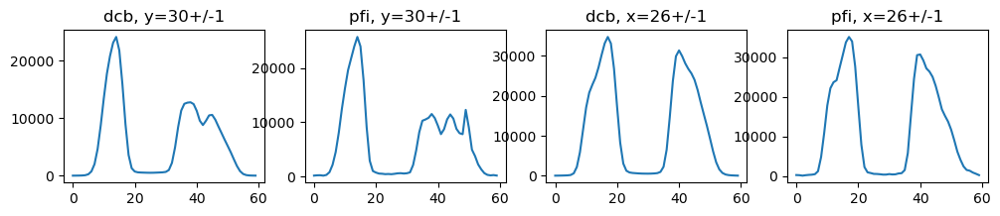

single_number = 5
iteration = 1
offset(DCB-PFI) =  [-0.2355, 0.504]
iteration = 2
offset(DCB-PFI) =  [-0.372, 0.0215]
iteration = 3
offset(DCB-PFI) =  [-0.0895, 0.0225]
iteration = 4
offset(DCB-PFI) =  [-0.055, 0.006]
iteration = 5
offset(DCB-PFI) =  [-0.0425, 0.0035]
iteration = 6
offset(DCB-PFI) =  [-0.0365, 0.003]
iteration = 7
offset(DCB-PFI) =  [-0.033, 0.0025]
iteration = 8
offset(DCB-PFI) =  [-0.0295, 0.002]
iteration = 9
offset(DCB-PFI) =  [-0.027, 0.002]
iteration = 10
offset(DCB-PFI) =  [-0.025, 0.0015]


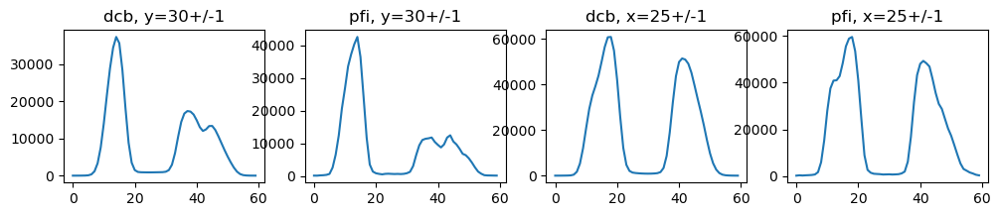

single_number = 6
iteration = 1
offset(DCB-PFI) =  [-0.042, 0.48]
iteration = 2
offset(DCB-PFI) =  [-0.3745, 0.0035]
iteration = 3
offset(DCB-PFI) =  [-0.026, 0.024]
iteration = 4
offset(DCB-PFI) =  [-0.0305, 0.004]
iteration = 5
offset(DCB-PFI) =  [-0.0175, 0.0035]
iteration = 6
offset(DCB-PFI) =  [-0.0155, 0.0035]
iteration = 7
offset(DCB-PFI) =  [-0.013, 0.003]
iteration = 8
offset(DCB-PFI) =  [-0.0125, 0.0025]


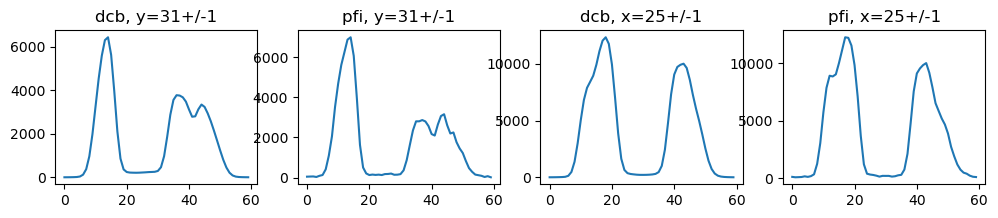

single_number = 11
iteration = 1
offset(DCB-PFI) =  [-0.268, 0.364]
iteration = 2
offset(DCB-PFI) =  [-0.153, 0.004]
iteration = 3
offset(DCB-PFI) =  [-0.0045, 0.005]


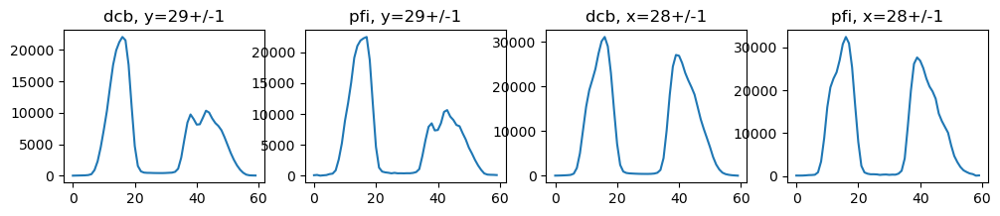

single_number = 14
iteration = 1
offset(DCB-PFI) =  [-2.288, 0.404]
iteration = 2
offset(DCB-PFI) =  [-0.366, 0.0375]
iteration = 3
offset(DCB-PFI) =  [-0.031, 0.003]
iteration = 4
offset(DCB-PFI) =  [-0.013, -0.0]
iteration = 5
offset(DCB-PFI) =  [-0.0115, -0.0]


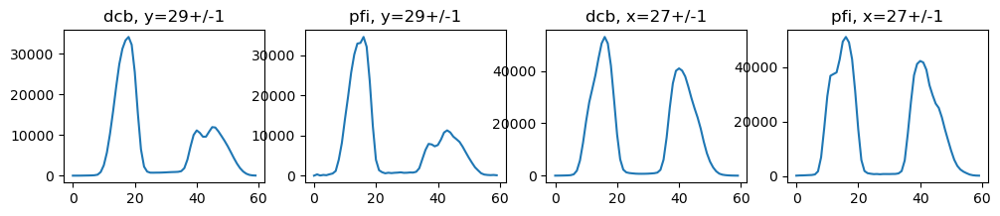

single_number = 15
iteration = 1
offset(DCB-PFI) =  [2.184, -2.762]
iteration = 2
offset(DCB-PFI) =  [-0.572, -0.012]
iteration = 3
offset(DCB-PFI) =  [-0.01, 0.0075]


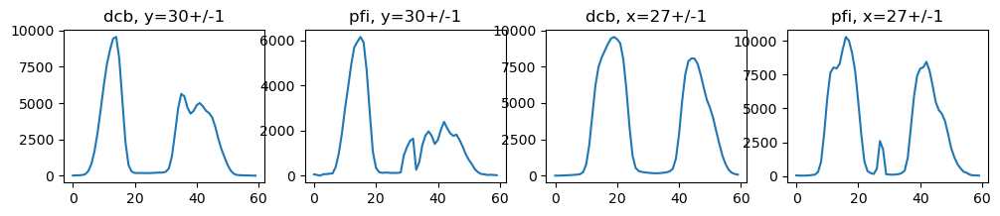

single_number = 20
iteration = 1
offset(DCB-PFI) =  [0.331, 0.52]
iteration = 2
offset(DCB-PFI) =  [-0.2705, -0.0045]
iteration = 3
offset(DCB-PFI) =  [-0.017, 0.008]
iteration = 4
offset(DCB-PFI) =  [-0.021, -0.0]
iteration = 5
offset(DCB-PFI) =  [-0.016, 0.0005]
iteration = 6
offset(DCB-PFI) =  [-0.015, -0.0]


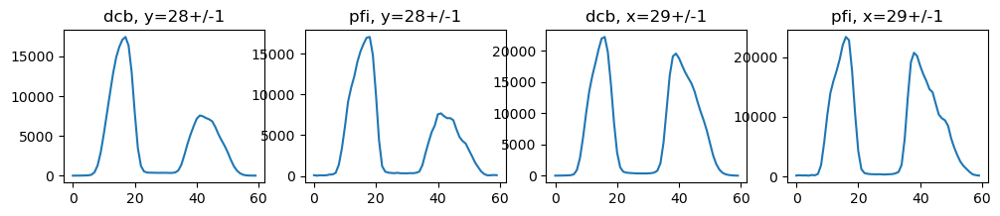

single_number = 23
iteration = 1
offset(DCB-PFI) =  [0.714, 0.4585]
iteration = 2
offset(DCB-PFI) =  [-0.7545, -0.0065]
iteration = 3
offset(DCB-PFI) =  [-0.0225, 0.0085]
iteration = 4
offset(DCB-PFI) =  [-0.0335, 0.001]
iteration = 5
offset(DCB-PFI) =  [-0.019, 0.0005]
iteration = 6
offset(DCB-PFI) =  [-0.0185, 0.0005]


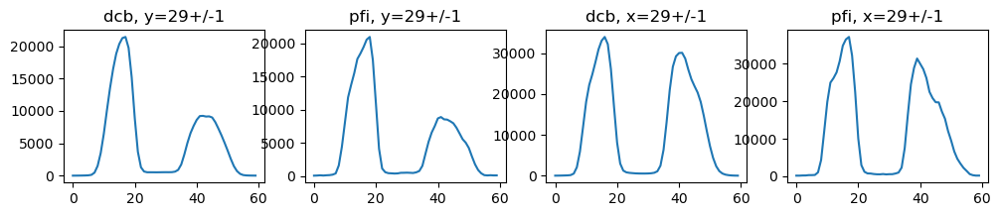

single_number = 24
iteration = 1
offset(DCB-PFI) =  [1.128, 0.3925]
iteration = 2
offset(DCB-PFI) =  [-1.086, -0.0225]
iteration = 3
offset(DCB-PFI) =  [-0.021, 0.02]
iteration = 4
offset(DCB-PFI) =  [-0.0625, 0.0005]
iteration = 5
offset(DCB-PFI) =  [-0.0305, 0.0025]
iteration = 6
offset(DCB-PFI) =  [-0.0275, 0.001]
iteration = 7
offset(DCB-PFI) =  [-0.023, 0.0015]
iteration = 8
offset(DCB-PFI) =  [-0.0215, 0.001]


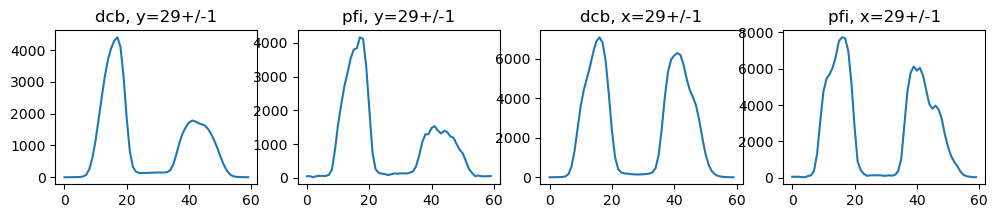

single_number = 25
iteration = 1
offset(DCB-PFI) =  [0.486, 0.417]
iteration = 2
offset(DCB-PFI) =  [-0.431, -0.0115]
iteration = 3
offset(DCB-PFI) =  [0.0025, 0.014]
iteration = 4
offset(DCB-PFI) =  [-0.0145, 0.0015]
iteration = 5
offset(DCB-PFI) =  [-0.0065, 0.002]


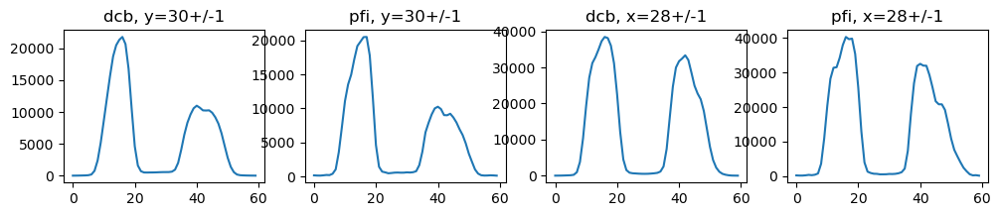

single_number = 29
iteration = 1
offset(DCB-PFI) =  [0.0965, 0.6145]
iteration = 2
offset(DCB-PFI) =  [-0.1705, 0.006]
iteration = 3
offset(DCB-PFI) =  [0.003, 0.001]


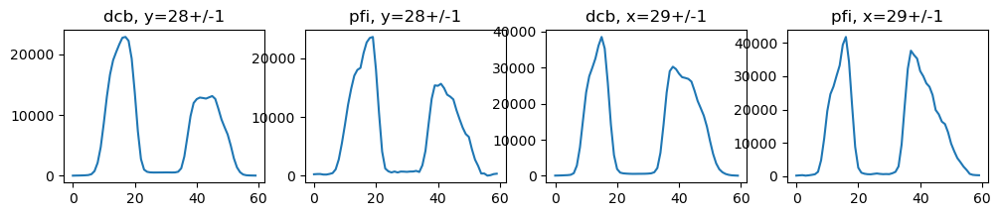

single_number = 32
iteration = 1
offset(DCB-PFI) =  [0.3265, 0.4645]
iteration = 2
offset(DCB-PFI) =  [-0.031, 0.003]
iteration = 3
offset(DCB-PFI) =  [-0.0455, -0.0]
iteration = 4
offset(DCB-PFI) =  [-0.0375, -0.0005]
iteration = 5
offset(DCB-PFI) =  [-0.0275, -0.0]
iteration = 6
offset(DCB-PFI) =  [-0.0225, 0.0005]
iteration = 7
offset(DCB-PFI) =  [-0.02, -0.0005]
iteration = 8
offset(DCB-PFI) =  [-0.0185, -0.0005]


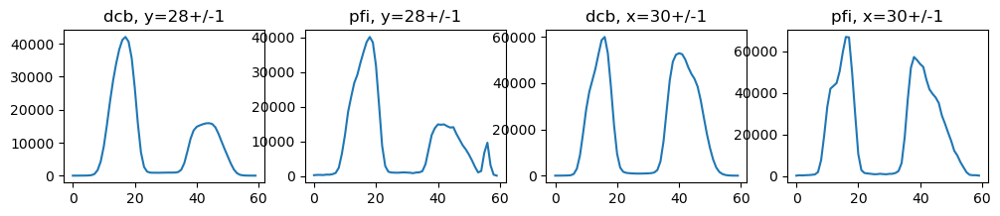

single_number = 33
iteration = 1
offset(DCB-PFI) =  [0.249, 0.524]
iteration = 2
offset(DCB-PFI) =  [-0.2985, -0.0025]
iteration = 3
offset(DCB-PFI) =  [0.0015, 0.0135]
iteration = 4
offset(DCB-PFI) =  [-0.0015, -0.0]


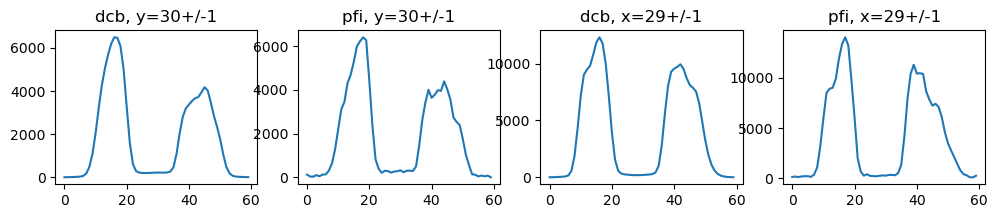

single_number = 38
iteration = 1
offset(DCB-PFI) =  [0.0115, 0.409]
iteration = 2
offset(DCB-PFI) =  [-0.0815, 0.002]
iteration = 3
offset(DCB-PFI) =  [-0.0045, -0.002]


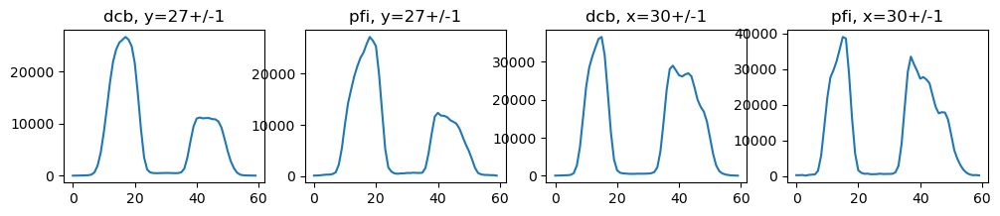

single_number = 41
iteration = 1
offset(DCB-PFI) =  [0.146, 0.418]
iteration = 2
offset(DCB-PFI) =  [-0.2215, -0.003]
iteration = 3
offset(DCB-PFI) =  [-0.002, 0.0045]


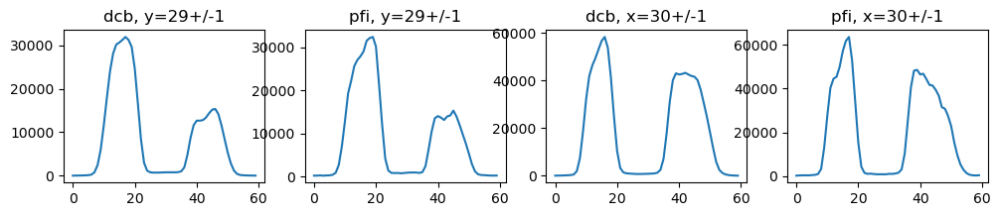

single_number = 42
iteration = 1
offset(DCB-PFI) =  [0.098, 0.4045]
iteration = 2
offset(DCB-PFI) =  [-0.23, 0.006]
iteration = 3
offset(DCB-PFI) =  [-0.0015, 0.003]


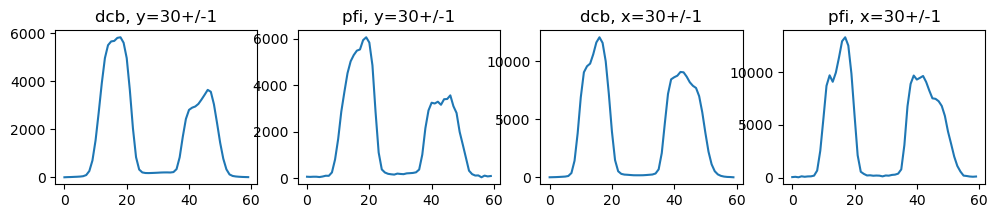

single_number = 47
iteration = 1
offset(DCB-PFI) =  [0.013, 0.5]
iteration = 2
offset(DCB-PFI) =  [-0.128, 0.001]
iteration = 3
offset(DCB-PFI) =  [0.0055, -0.004]


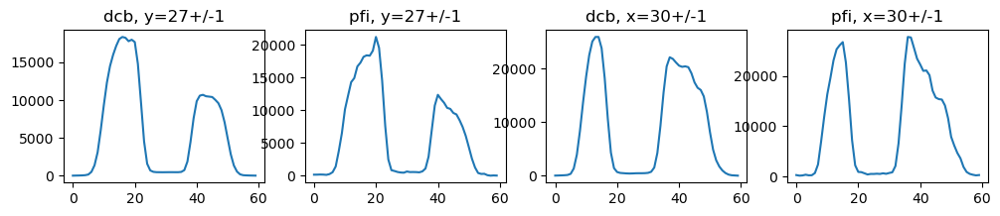

single_number = 50
iteration = 1
offset(DCB-PFI) =  [-0.012, 0.3975]
iteration = 2
offset(DCB-PFI) =  [-0.1325, -0.001]
iteration = 3
offset(DCB-PFI) =  [-0.002, 0.003]


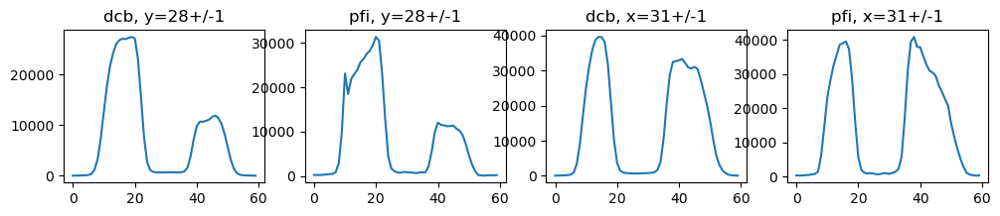

single_number = 51
iteration = 1
offset(DCB-PFI) =  [0.0605, 0.346]
iteration = 2
offset(DCB-PFI) =  [-0.0025, -0.0015]


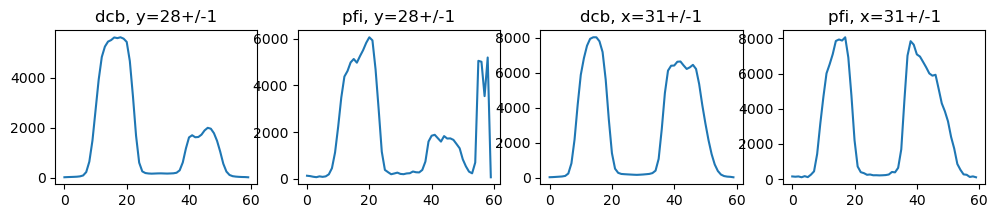

single_number = 56
iteration = 1
offset(DCB-PFI) =  [0.1585, 0.3945]
iteration = 2
offset(DCB-PFI) =  [-0.086, -0.0115]
iteration = 3
offset(DCB-PFI) =  [0.003, -0.004]


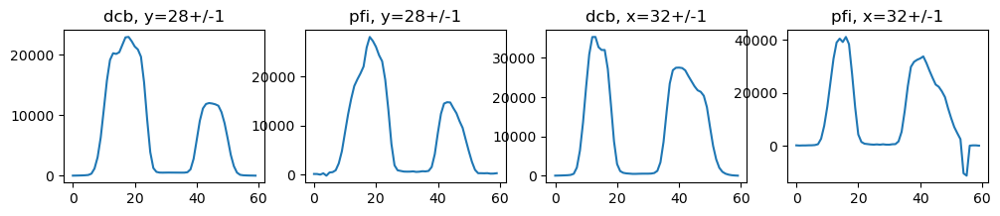

single_number = 59
iteration = 1
offset(DCB-PFI) =  [0.022, 0.3405]
iteration = 2
offset(DCB-PFI) =  [-0.0295, 0.0065]
iteration = 3
offset(DCB-PFI) =  [-0.015, 0.003]
iteration = 4
offset(DCB-PFI) =  [-0.013, 0.001]


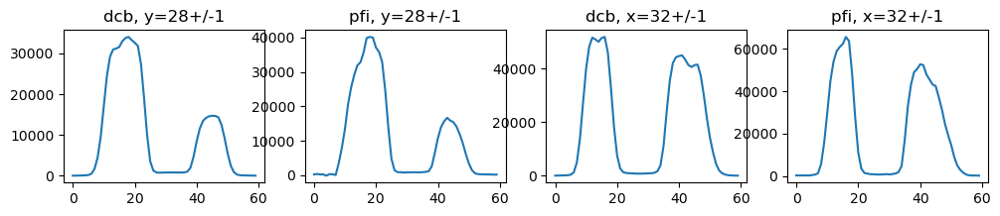

single_number = 60
iteration = 1
offset(DCB-PFI) =  [0.228, 0.4]
iteration = 2
offset(DCB-PFI) =  [-0.2095, -0.005]
iteration = 3
offset(DCB-PFI) =  [-0.022, 0.0035]
iteration = 4
offset(DCB-PFI) =  [-0.01, 0.0005]


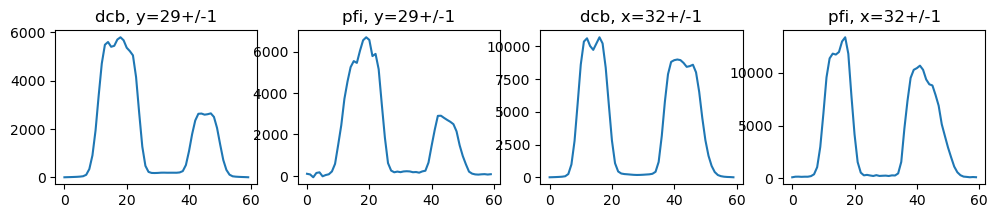

single_number = 65
iteration = 1
offset(DCB-PFI) =  [0.295, 0.1115]
iteration = 2
offset(DCB-PFI) =  [-0.028, -0.004]
iteration = 3
offset(DCB-PFI) =  [-0.0, -0.001]


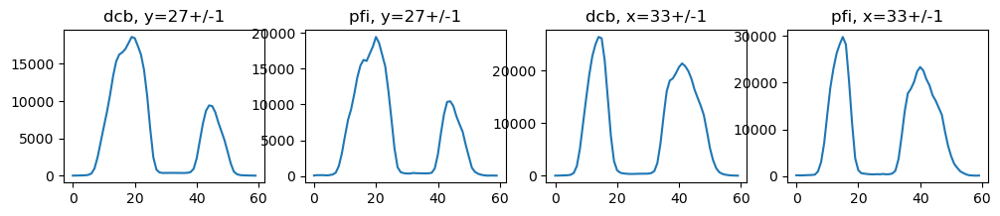

single_number = 68
iteration = 1
offset(DCB-PFI) =  [0.324, 0.2955]
iteration = 2
offset(DCB-PFI) =  [-0.109, -0.0035]
iteration = 3
offset(DCB-PFI) =  [-0.002, 0.0015]


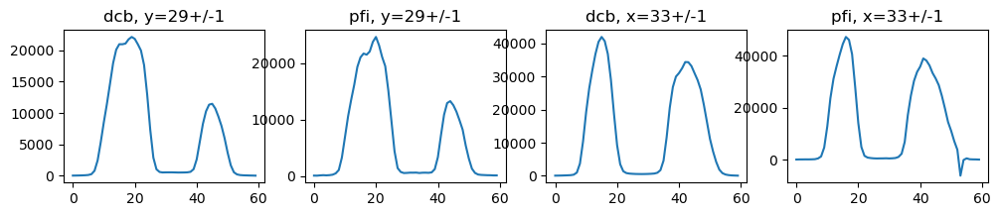

single_number = 69
iteration = 1
offset(DCB-PFI) =  [0.3345, 0.26]
iteration = 2
offset(DCB-PFI) =  [-0.1185, -0.0025]
iteration = 3
offset(DCB-PFI) =  [-0.0, 0.0025]


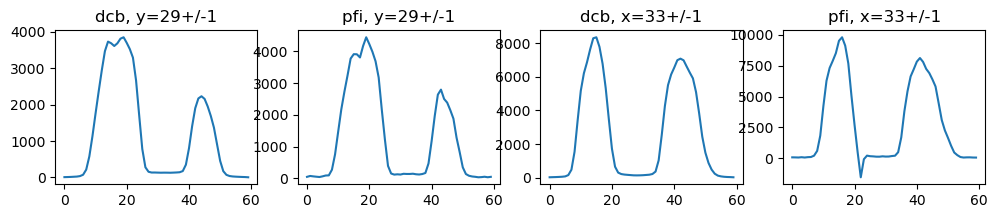

single_number = 74
iteration = 1
offset(DCB-PFI) =  [0.61, 0.299]
iteration = 2
offset(DCB-PFI) =  [-0.039, 0.0135]
iteration = 3
offset(DCB-PFI) =  [0.012, 0.0025]
iteration = 4
offset(DCB-PFI) =  [0.014, 0.003]


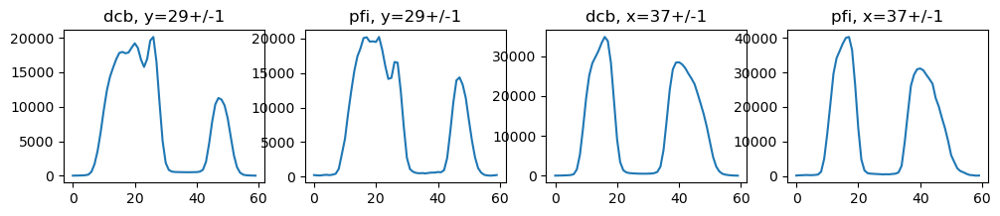

single_number = 77
iteration = 1
offset(DCB-PFI) =  [0.388, 0.3305]
iteration = 2
offset(DCB-PFI) =  [-0.029, 0.0065]
iteration = 3
offset(DCB-PFI) =  [0.0005, 0.001]


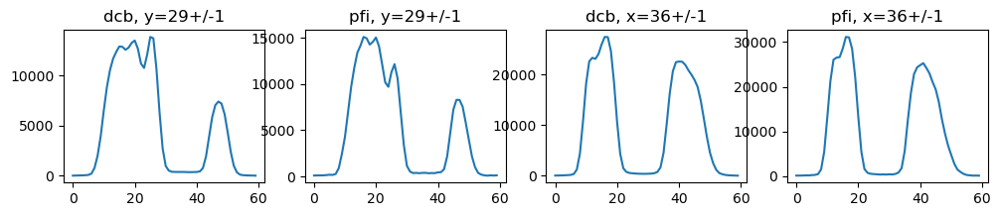

single_number = 78
iteration = 1
offset(DCB-PFI) =  [0.5585, 0.3185]
iteration = 2
offset(DCB-PFI) =  [-0.072, 0.013]
iteration = 3
offset(DCB-PFI) =  [-0.001, 0.0005]


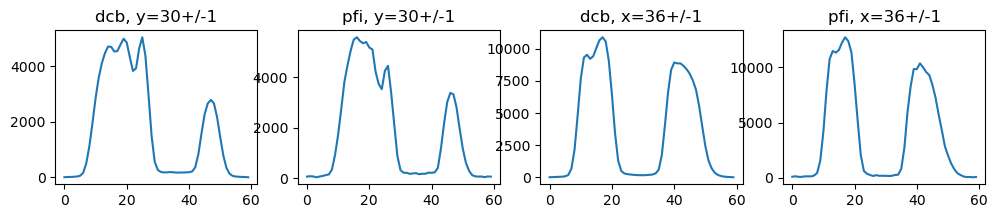

single_number = 79
iteration = 1
offset(DCB-PFI) =  [0.344, 0.5245]
iteration = 2
offset(DCB-PFI) =  [-0.095, -0.0045]
iteration = 3
offset(DCB-PFI) =  [0.007, 0.0075]


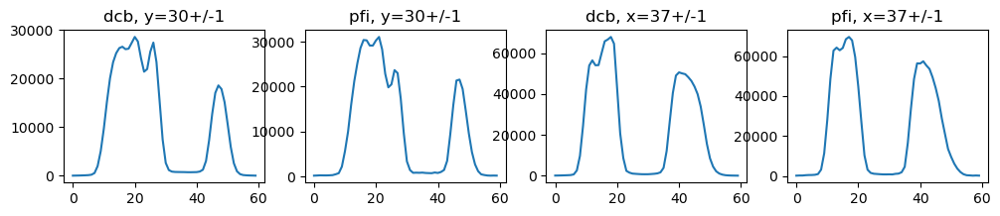

single_number = 83
iteration = 1
offset(DCB-PFI) =  [0.662, 0.3765]
iteration = 2
offset(DCB-PFI) =  [-0.0065, 0.0255]
iteration = 3
offset(DCB-PFI) =  [0.016, 0.002]
iteration = 4
offset(DCB-PFI) =  [0.0195, 0.0035]
iteration = 5
offset(DCB-PFI) =  [0.02, 0.003]


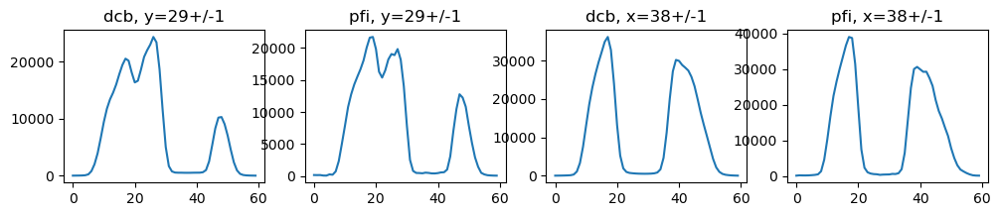

single_number = 86
iteration = 1
offset(DCB-PFI) =  [0.5285, 0.398]
iteration = 2
offset(DCB-PFI) =  [0.1125, 0.018]
iteration = 3
offset(DCB-PFI) =  [0.007, 0.006]


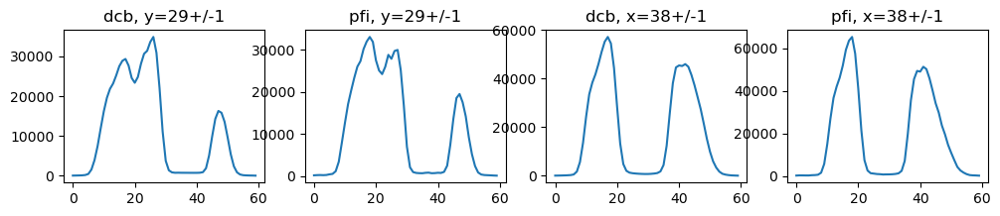

single_number = 87
iteration = 1
offset(DCB-PFI) =  [0.464, 0.449]
iteration = 2
offset(DCB-PFI) =  [0.0405, 0.0025]
iteration = 3
offset(DCB-PFI) =  [0.0095, 0.0025]


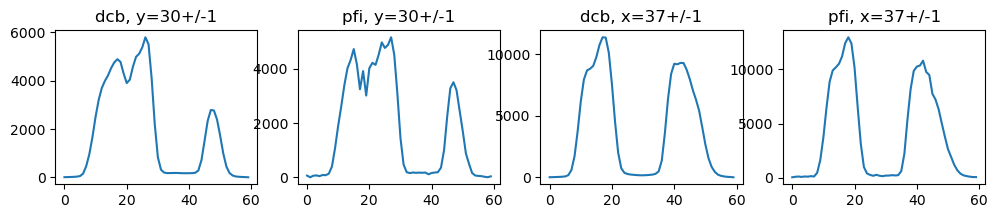

single_number = 101
iteration = 1
offset(DCB-PFI) =  [-0.591, 0.3535]
iteration = 2
offset(DCB-PFI) =  [-0.102, 0.0305]
iteration = 3
offset(DCB-PFI) =  [-0.0165, 0.006]
iteration = 4
offset(DCB-PFI) =  [-0.007, 0.0015]


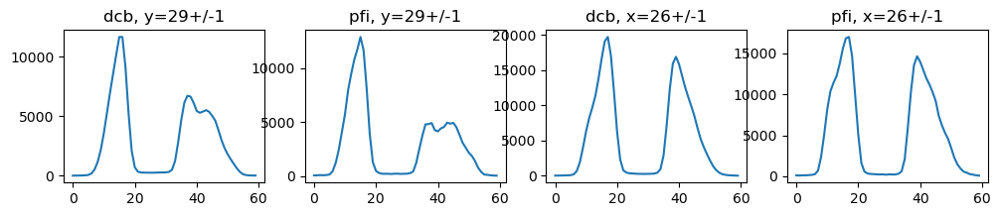

single_number = 104
iteration = 1
offset(DCB-PFI) =  [-0.4785, 0.4]
iteration = 2
offset(DCB-PFI) =  [-0.2125, 0.014]
iteration = 3
offset(DCB-PFI) =  [-0.0245, 0.0095]
iteration = 4
offset(DCB-PFI) =  [-0.0155, 0.0035]
iteration = 5
offset(DCB-PFI) =  [-0.011, 0.0035]
iteration = 6
offset(DCB-PFI) =  [-0.0105, 0.0025]


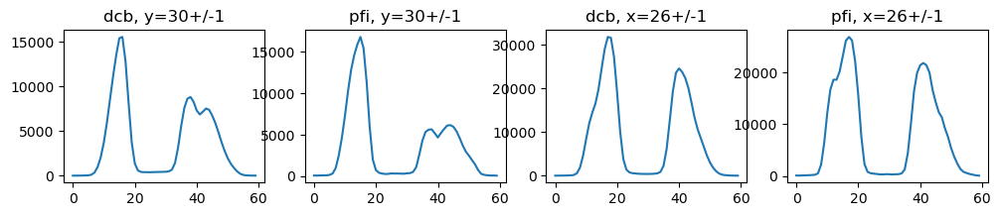

single_number = 105
iteration = 1
offset(DCB-PFI) =  [-0.4515, 0.424]
iteration = 2
offset(DCB-PFI) =  [-0.227, 0.0095]
iteration = 3
offset(DCB-PFI) =  [-0.016, 0.008]
iteration = 4
offset(DCB-PFI) =  [-0.0165, 0.0025]
iteration = 5
offset(DCB-PFI) =  [-0.014, 0.0025]
iteration = 6
offset(DCB-PFI) =  [-0.013, 0.0025]


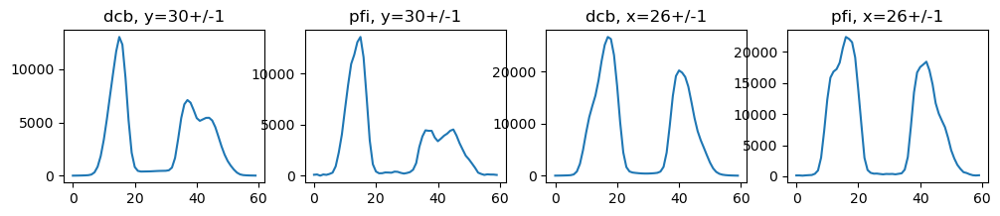

single_number = 106
iteration = 1
offset(DCB-PFI) =  [-0.4055, 0.4605]
iteration = 2
offset(DCB-PFI) =  [-0.2045, 0.0155]
iteration = 3
offset(DCB-PFI) =  [-0.017, 0.011]
iteration = 4
offset(DCB-PFI) =  [-0.013, 0.0035]
iteration = 5
offset(DCB-PFI) =  [-0.0095, 0.003]


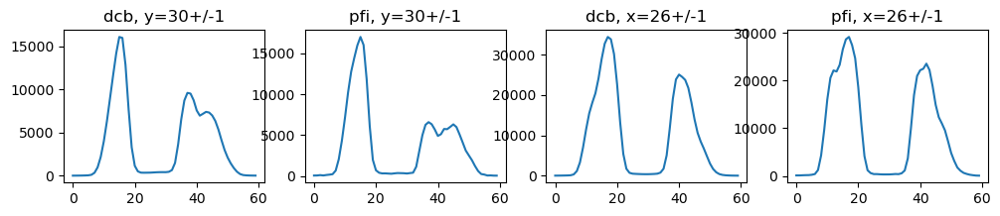

single_number = 119
iteration = 1
offset(DCB-PFI) =  [-0.5135, 0.537]
iteration = 2
offset(DCB-PFI) =  [-0.194, -0.0]
iteration = 3
offset(DCB-PFI) =  [0.0005, 0.003]


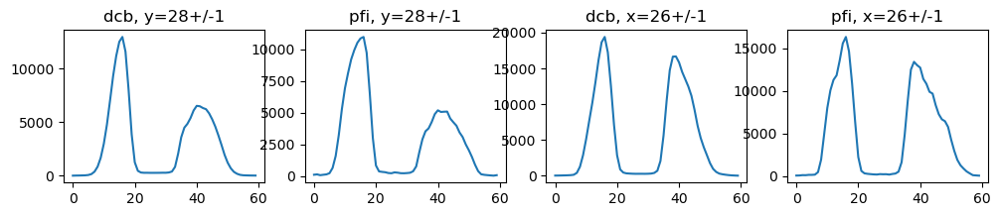

single_number = 122
iteration = 1
offset(DCB-PFI) =  [-0.1875, 0.499]
iteration = 2
offset(DCB-PFI) =  [-0.3375, 0.006]
iteration = 3
offset(DCB-PFI) =  [-0.0105, 0.008]
iteration = 4
offset(DCB-PFI) =  [-0.012, 0.002]
iteration = 5
offset(DCB-PFI) =  [-0.0085, 0.002]


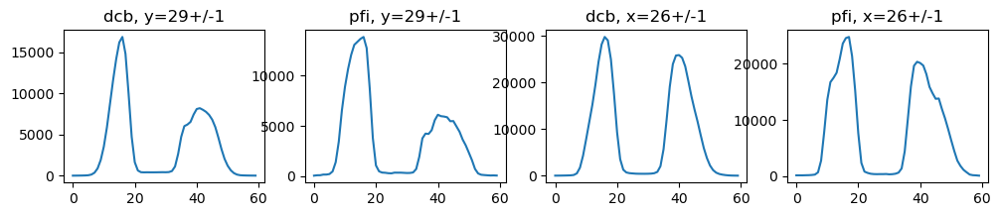

single_number = 123
iteration = 1
offset(DCB-PFI) =  [0.7955, 0.536]
iteration = 2
offset(DCB-PFI) =  [-1.505, -0.0075]
iteration = 3
offset(DCB-PFI) =  [-0.017, 0.0215]
iteration = 4
offset(DCB-PFI) =  [-0.0345, 0.002]
iteration = 5
offset(DCB-PFI) =  [-0.0215, 0.002]
iteration = 6
offset(DCB-PFI) =  [-0.0205, 0.0015]


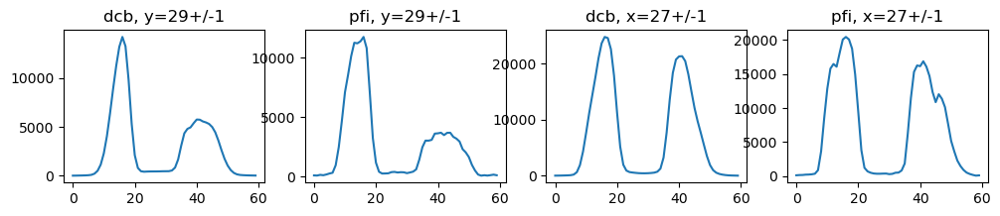

single_number = 124
iteration = 1
offset(DCB-PFI) =  [-0.2125, 0.578]
iteration = 2
offset(DCB-PFI) =  [-0.361, 0.0045]
iteration = 3
offset(DCB-PFI) =  [-0.0065, 0.01]


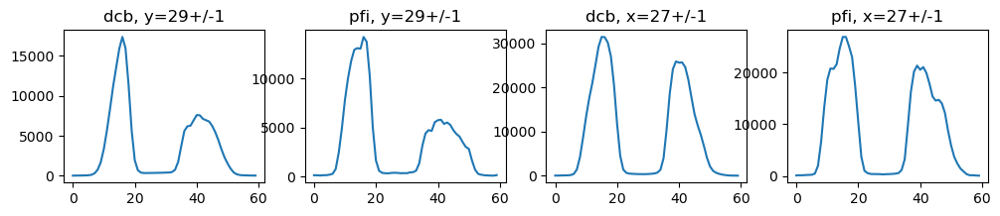

single_number = 137
iteration = 1
offset(DCB-PFI) =  [-0.0405, 0.538]
iteration = 2
offset(DCB-PFI) =  [-0.192, -0.0015]
iteration = 3
offset(DCB-PFI) =  [-0.002, 0.003]


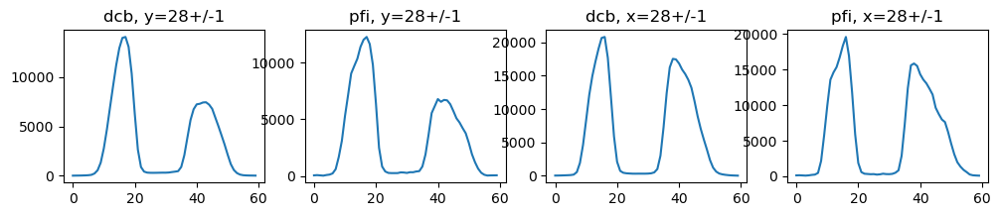

single_number = 140
iteration = 1
offset(DCB-PFI) =  [0.007, 0.5075]
iteration = 2
offset(DCB-PFI) =  [-0.2285, -0.0005]
iteration = 3
offset(DCB-PFI) =  [-0.011, 0.0015]
iteration = 4
offset(DCB-PFI) =  [-0.01, 0.0005]


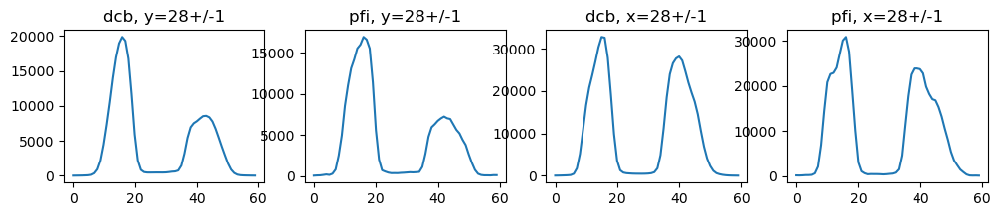

single_number = 141
iteration = 1
offset(DCB-PFI) =  [0.3015, 0.5665]
iteration = 2
offset(DCB-PFI) =  [-0.642, -0.0015]
iteration = 3
offset(DCB-PFI) =  [-0.0205, 0.012]
iteration = 4
offset(DCB-PFI) =  [-0.0245, 0.0025]
iteration = 5
offset(DCB-PFI) =  [-0.017, 0.002]
iteration = 6
offset(DCB-PFI) =  [-0.015, 0.0015]
iteration = 7
offset(DCB-PFI) =  [-0.014, 0.002]


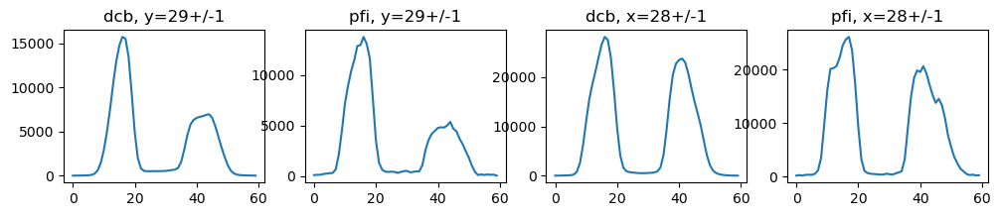

single_number = 142
iteration = 1
offset(DCB-PFI) =  [0.1385, 0.5555]
iteration = 2
offset(DCB-PFI) =  [-0.3755, -0.009]
iteration = 3
offset(DCB-PFI) =  [0.003, 0.012]
iteration = 4
offset(DCB-PFI) =  [-0.007, 0.001]


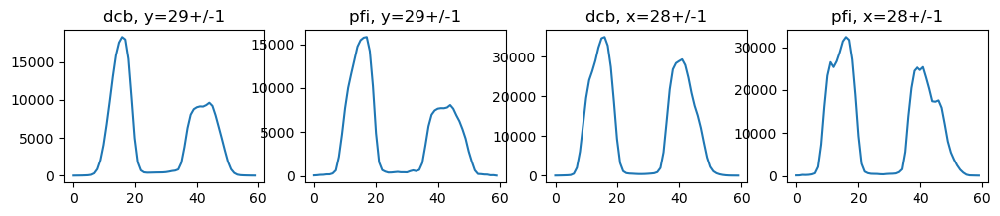

single_number = 146
iteration = 1
offset(DCB-PFI) =  [-0.136, 0.367]
iteration = 2
offset(DCB-PFI) =  [-0.0695, -0.002]
iteration = 3
offset(DCB-PFI) =  [-0.0005, -0.0035]


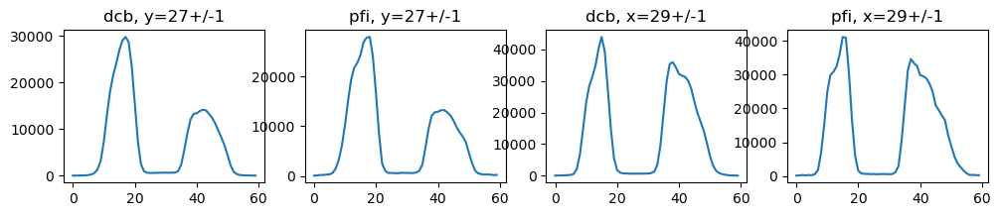

single_number = 149
iteration = 1
offset(DCB-PFI) =  [-0.1185, 0.255]
iteration = 2
offset(DCB-PFI) =  [-0.1085, -0.004]
iteration = 3
offset(DCB-PFI) =  [-0.0095, -0.0]


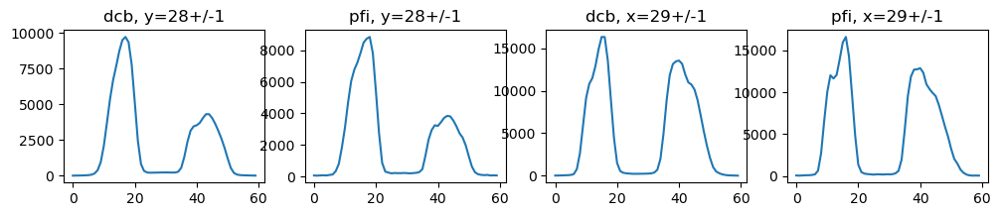

single_number = 150
iteration = 1
offset(DCB-PFI) =  [-0.12, 0.2465]
iteration = 2
offset(DCB-PFI) =  [-0.151, 0.001]
iteration = 3
offset(DCB-PFI) =  [-0.0075, 0.0055]


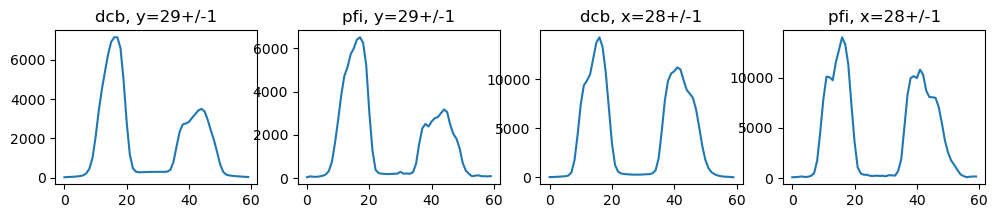

single_number = 151
iteration = 1
offset(DCB-PFI) =  [-0.1105, 0.344]
iteration = 2
offset(DCB-PFI) =  [-0.0925, 0.0085]
iteration = 3
offset(DCB-PFI) =  [-0.0275, 0.003]
iteration = 4
offset(DCB-PFI) =  [-0.0225, 0.0005]
iteration = 5
offset(DCB-PFI) =  [-0.0205, -0.0]


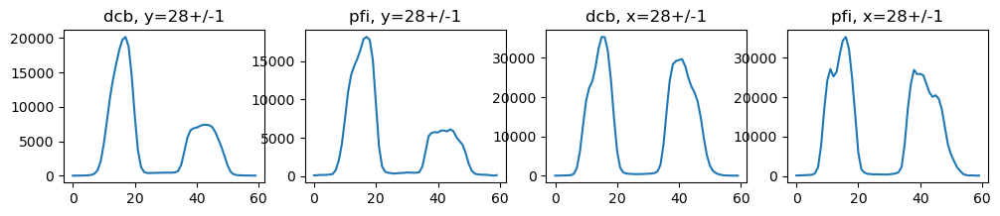

single_number = 155
iteration = 1
offset(DCB-PFI) =  [-0.0655, 0.426]
iteration = 2
offset(DCB-PFI) =  [-0.1015, -0.002]
iteration = 3
offset(DCB-PFI) =  [0.0005, -0.0035]


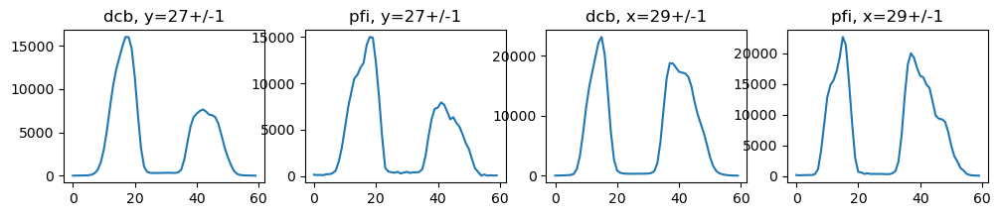

single_number = 158
iteration = 1
offset(DCB-PFI) =  [0.002, 0.3555]
iteration = 2
offset(DCB-PFI) =  [-0.1775, -0.0015]
iteration = 3
offset(DCB-PFI) =  [-0.0045, -0.003]


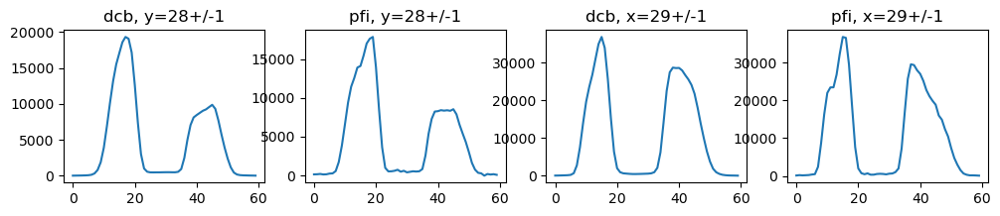

single_number = 159
iteration = 1
offset(DCB-PFI) =  [-0.036, 0.355]
iteration = 2
offset(DCB-PFI) =  [-0.122, 0.0055]
iteration = 3
offset(DCB-PFI) =  [-0.033, 0.0005]
iteration = 4
offset(DCB-PFI) =  [-0.02, -0.0005]
iteration = 5
offset(DCB-PFI) =  [-0.0185, -0.0]


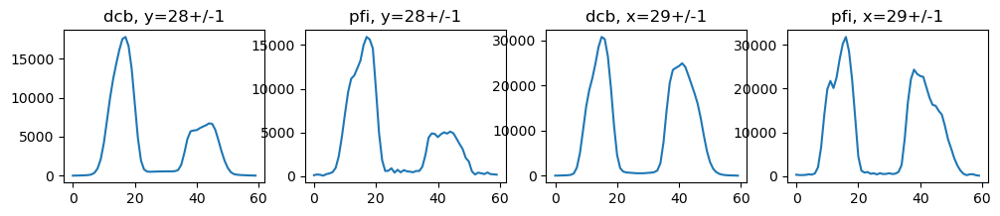

single_number = 160
iteration = 1
offset(DCB-PFI) =  [0.043, 0.4025]
iteration = 2
offset(DCB-PFI) =  [-0.206, -0.006]
iteration = 3
offset(DCB-PFI) =  [-0.0085, 0.0005]


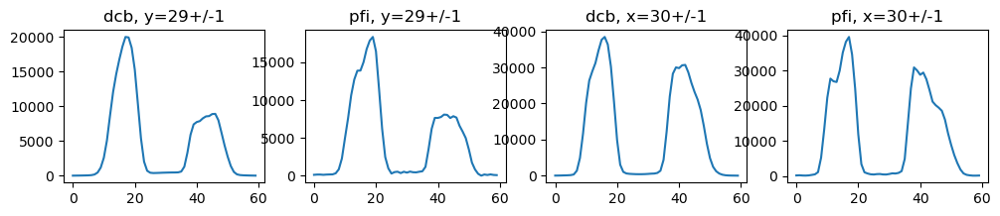

single_number = 173
iteration = 1
offset(DCB-PFI) =  [-0.2545, 0.3835]
iteration = 2
offset(DCB-PFI) =  [-0.0815, 0.0015]
iteration = 3
offset(DCB-PFI) =  [0.004, -0.0025]


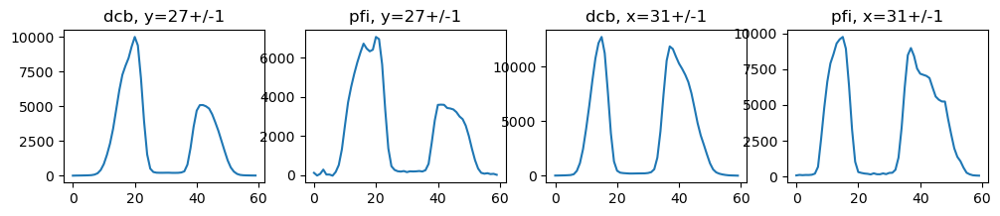

single_number = 176
iteration = 1
offset(DCB-PFI) =  [-0.264, 0.446]
iteration = 2
offset(DCB-PFI) =  [-0.055, 0.0065]
iteration = 3
offset(DCB-PFI) =  [-0.011, -0.0005]
iteration = 4
offset(DCB-PFI) =  [-0.0085, -0.0015]


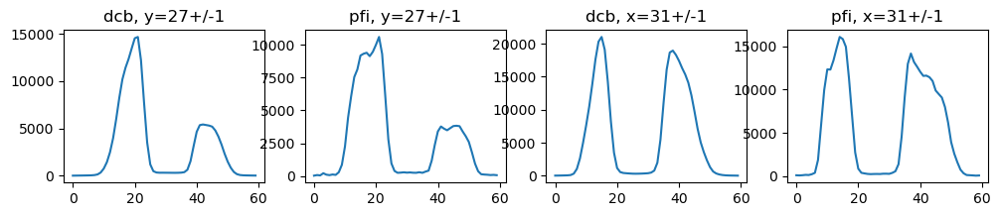

single_number = 177
iteration = 1
offset(DCB-PFI) =  [-0.0875, 0.44]
iteration = 2
offset(DCB-PFI) =  [-0.2405, -0.004]
iteration = 3
offset(DCB-PFI) =  [0.001, 0.001]


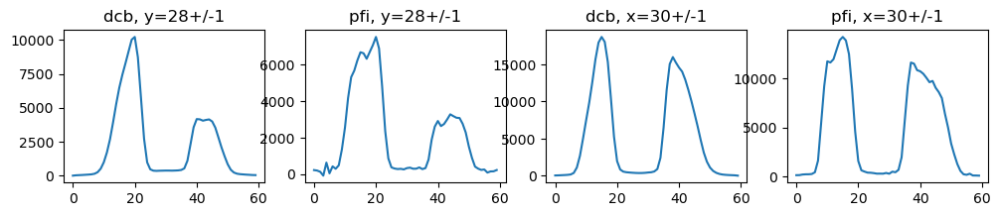

single_number = 178
iteration = 1
offset(DCB-PFI) =  [-0.3795, 0.4505]
iteration = 2
offset(DCB-PFI) =  [-0.0345, 0.008]
iteration = 3
offset(DCB-PFI) =  [-0.015, 0.0005]
iteration = 4
offset(DCB-PFI) =  [-0.013, -0.0]


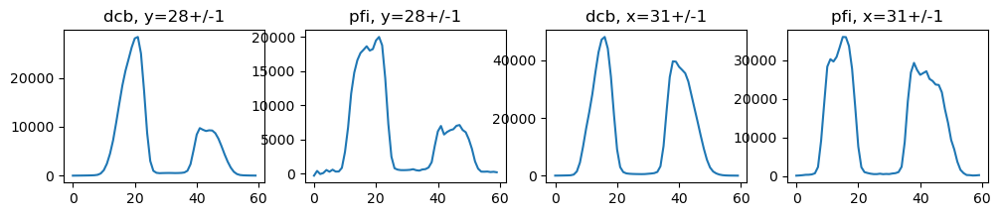

single_number = 191
iteration = 1
offset(DCB-PFI) =  [-0.165, 0.5805]
iteration = 2
offset(DCB-PFI) =  [-0.061, -0.0025]
iteration = 3
offset(DCB-PFI) =  [0.001, -0.0075]


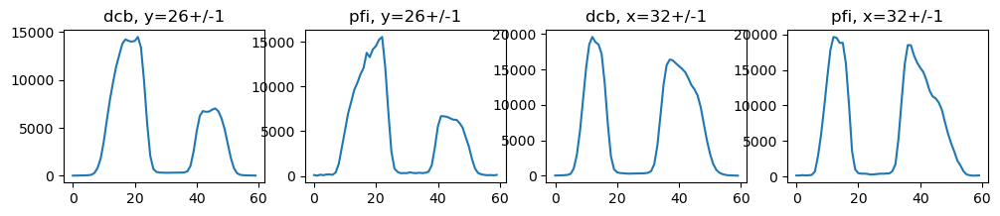

single_number = 194
iteration = 1
offset(DCB-PFI) =  [0.0215, 0.487]
iteration = 2
offset(DCB-PFI) =  [-0.1945, -0.001]
iteration = 3
offset(DCB-PFI) =  [0.004, 0.0025]


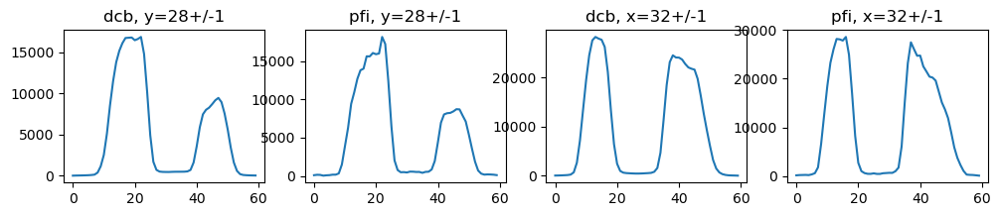

single_number = 195
iteration = 1
offset(DCB-PFI) =  [-0.1695, 0.418]
iteration = 2
offset(DCB-PFI) =  [-0.073, 0.0055]
iteration = 3
offset(DCB-PFI) =  [-0.0185, 0.001]
iteration = 4
offset(DCB-PFI) =  [-0.0155, -0.0]
iteration = 5
offset(DCB-PFI) =  [-0.012, -0.0005]
iteration = 6
offset(DCB-PFI) =  [-0.008, -0.0005]


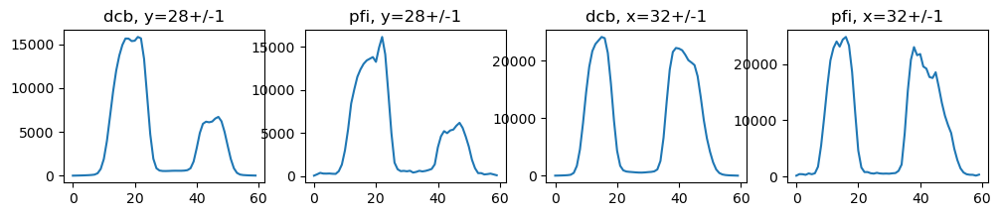

single_number = 196
iteration = 1
offset(DCB-PFI) =  [0.1105, 0.4805]
iteration = 2
offset(DCB-PFI) =  [-0.198, -0.006]
iteration = 3
offset(DCB-PFI) =  [-0.003, 0.003]


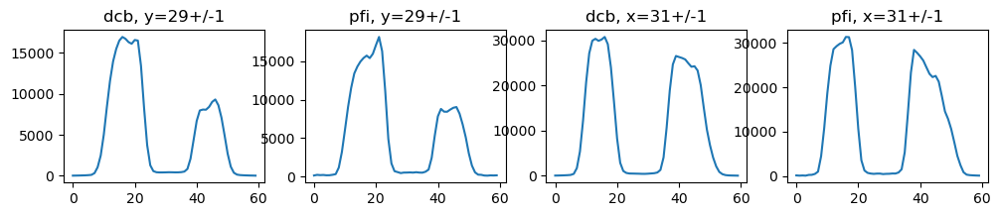

single_number = 209
iteration = 1
offset(DCB-PFI) =  [0.133, 0.1775]
iteration = 2
offset(DCB-PFI) =  [-0.0305, -0.0025]
iteration = 3
offset(DCB-PFI) =  [0.0025, -0.0005]


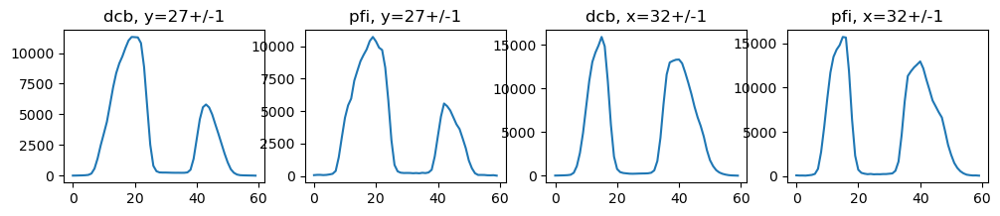

single_number = 212
iteration = 1
offset(DCB-PFI) =  [0.173, 0.1485]
iteration = 2
offset(DCB-PFI) =  [-0.001, 0.0025]


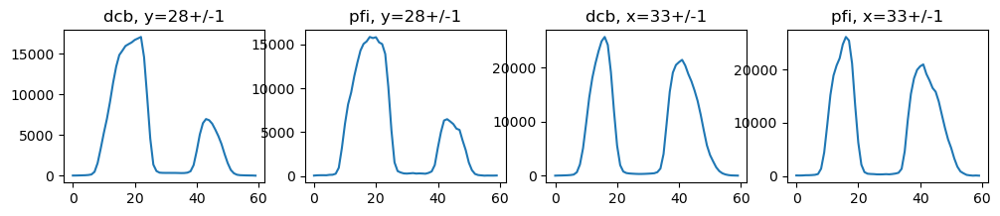

single_number = 213
iteration = 1
offset(DCB-PFI) =  [0.1495, 0.1875]
iteration = 2
offset(DCB-PFI) =  [-0.026, 0.0035]
iteration = 3
offset(DCB-PFI) =  [-0.008, 0.0025]


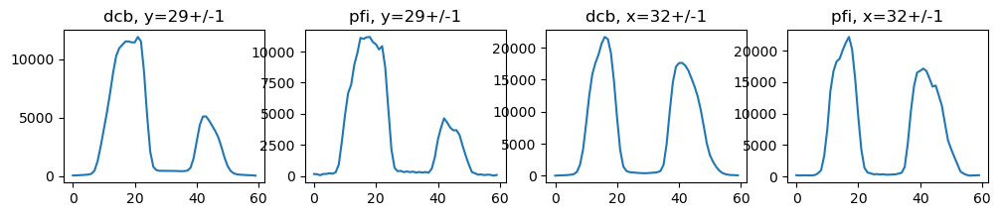

single_number = 214
iteration = 1
offset(DCB-PFI) =  [0.2325, 0.272]
iteration = 2
offset(DCB-PFI) =  [-0.076, 0.001]
iteration = 3
offset(DCB-PFI) =  [-0.002, 0.002]


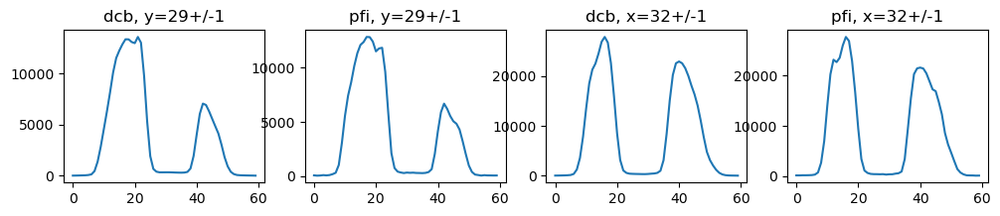

single_number = 218
iteration = 1
offset(DCB-PFI) =  [-0.0105, 0.2215]
iteration = 2
offset(DCB-PFI) =  [-0.0415, 0.0025]
iteration = 3
offset(DCB-PFI) =  [0.0035, -0.0]


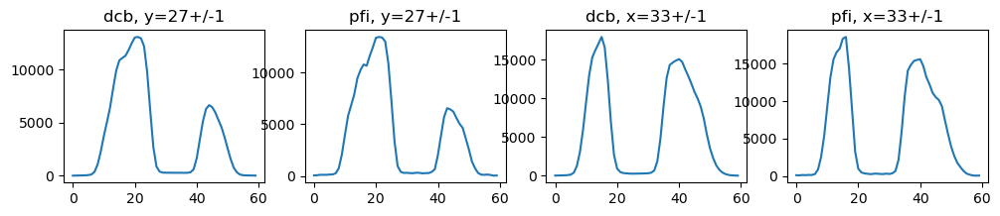

single_number = 221
iteration = 1
offset(DCB-PFI) =  [0.059, 0.1325]
iteration = 2
offset(DCB-PFI) =  [-0.0485, 0.002]
iteration = 3
offset(DCB-PFI) =  [-0.002, 0.002]


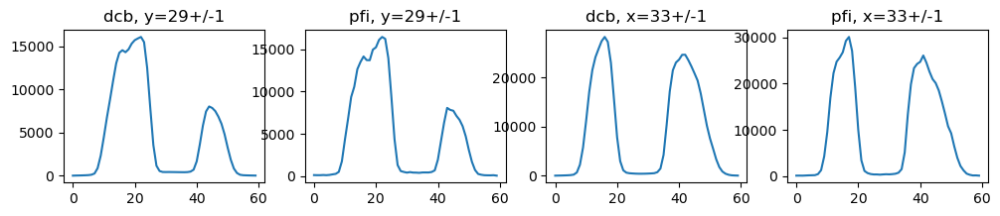

single_number = 222
iteration = 1
offset(DCB-PFI) =  [0.0265, 0.1445]
iteration = 2
offset(DCB-PFI) =  [-0.0075, 0.0055]


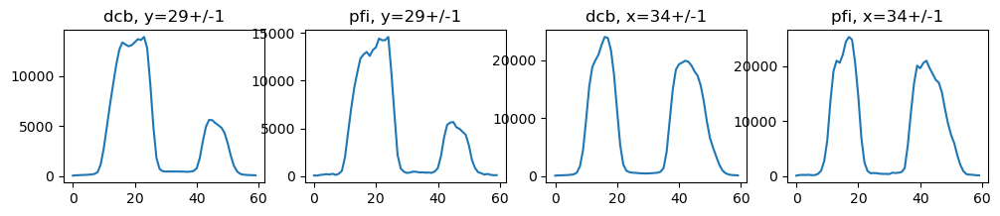

single_number = 223
iteration = 1
offset(DCB-PFI) =  [0.1, 0.1155]
iteration = 2
offset(DCB-PFI) =  [-0.033, 0.0025]
iteration = 3
offset(DCB-PFI) =  [-0.0045, 0.001]


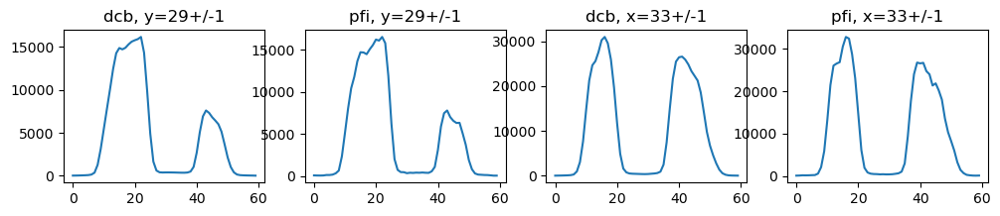

single_number = 227
iteration = 1
offset(DCB-PFI) =  [0.078, 0.4245]
iteration = 2
offset(DCB-PFI) =  [-0.0105, -0.001]
iteration = 3
offset(DCB-PFI) =  [0.0025, 0.001]


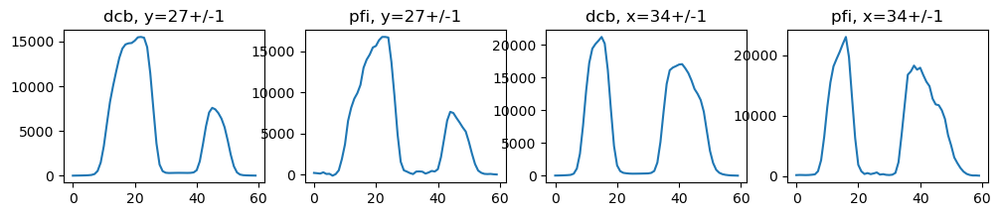

single_number = 230
iteration = 1
offset(DCB-PFI) =  [0.0215, 0.4]
iteration = 2
offset(DCB-PFI) =  [0.014, 0.001]
iteration = 3
offset(DCB-PFI) =  [-0.003, -0.0]


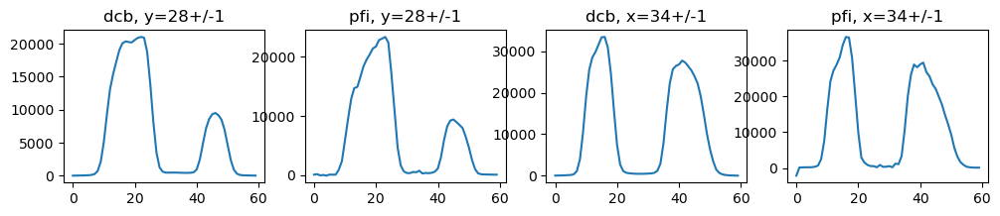

single_number = 231
iteration = 1
offset(DCB-PFI) =  [0.228, 0.2675]
iteration = 2
offset(DCB-PFI) =  [-0.106, 0.0025]
iteration = 3
offset(DCB-PFI) =  [0.004, 0.0025]


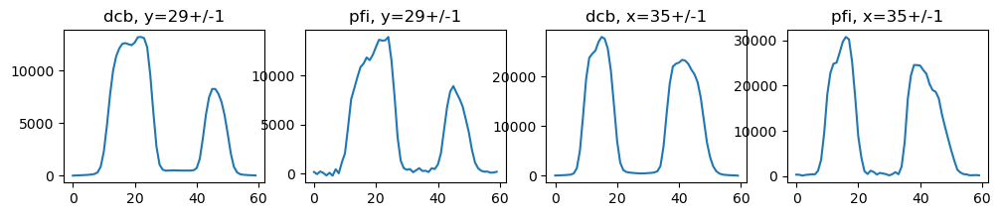

single_number = 232
iteration = 1
offset(DCB-PFI) =  [-0.0125, 0.3275]
iteration = 2
offset(DCB-PFI) =  [-0.0745, -0.001]
iteration = 3
offset(DCB-PFI) =  [-0.0025, 0.0015]


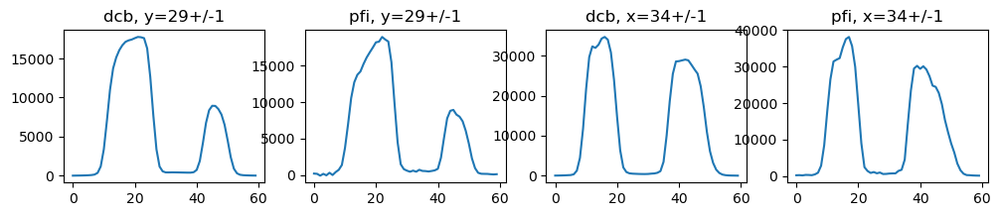

single_number = 263
iteration = 1
offset(DCB-PFI) =  [0.4285, 0.2075]
iteration = 2
offset(DCB-PFI) =  [-0.017, 0.014]
iteration = 3
offset(DCB-PFI) =  [0.0095, 0.0025]


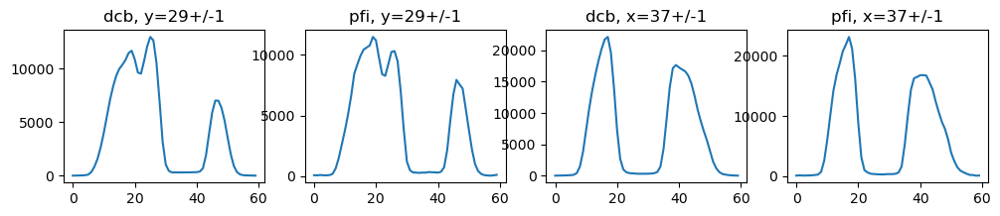

single_number = 266
iteration = 1
offset(DCB-PFI) =  [0.403, 0.226]
iteration = 2
offset(DCB-PFI) =  [0.051, 0.0065]
iteration = 3
offset(DCB-PFI) =  [0.005, 0.003]


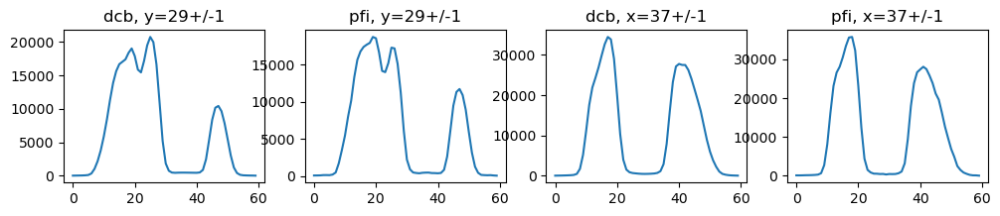

single_number = 267
iteration = 1
offset(DCB-PFI) =  [0.4895, 0.286]
iteration = 2
offset(DCB-PFI) =  [-0.046, 0.0145]
iteration = 3
offset(DCB-PFI) =  [-0.0005, -0.0005]


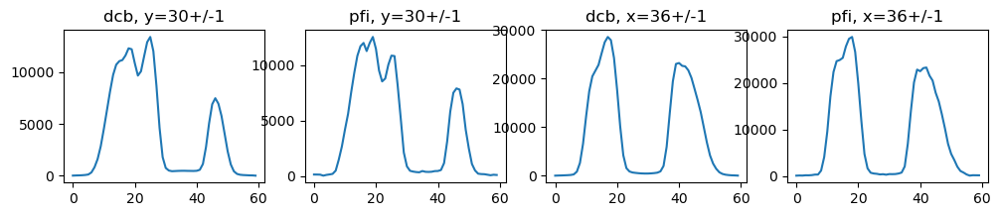

single_number = 268
iteration = 1
offset(DCB-PFI) =  [0.5625, 0.3325]
iteration = 2
offset(DCB-PFI) =  [-0.0525, 0.0165]
iteration = 3
offset(DCB-PFI) =  [0.002, -0.0015]


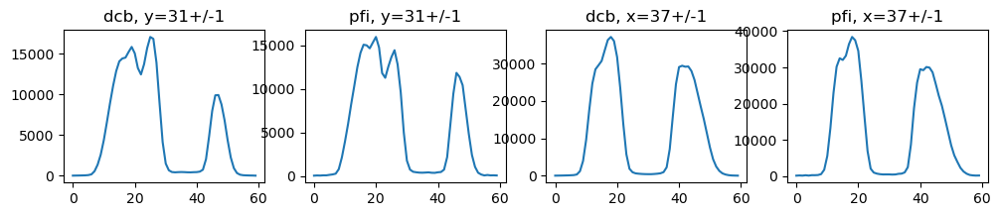

single_number = 272
iteration = 1
offset(DCB-PFI) =  [0.718, -0.012]
iteration = 2
offset(DCB-PFI) =  [0.012, 0.016]
iteration = 3
offset(DCB-PFI) =  [0.014, 0.0035]
iteration = 4
offset(DCB-PFI) =  [0.016, 0.003]


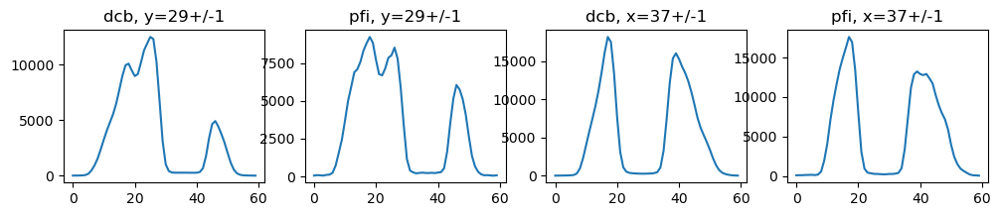

single_number = 275
iteration = 1
offset(DCB-PFI) =  [0.838, 0.0365]
iteration = 2
offset(DCB-PFI) =  [0.019, 0.0255]
iteration = 3
offset(DCB-PFI) =  [0.014, 0.0025]
iteration = 4
offset(DCB-PFI) =  [0.0135, 0.0025]


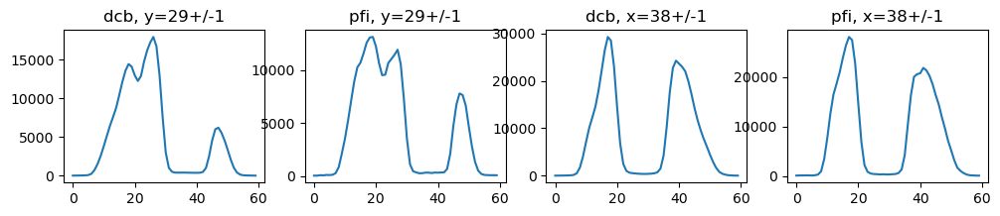

single_number = 276
iteration = 1
offset(DCB-PFI) =  [0.7525, 0.116]
iteration = 2
offset(DCB-PFI) =  [-0.0155, 0.014]
iteration = 3
offset(DCB-PFI) =  [0.0065, 0.0005]


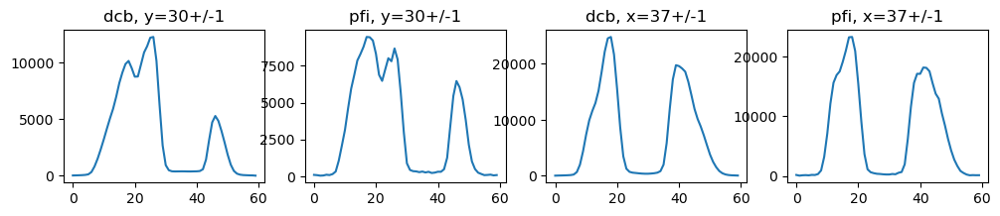

single_number = 277
iteration = 1
offset(DCB-PFI) =  [0.8065, 0.2435]
iteration = 2
offset(DCB-PFI) =  [-0.0215, 0.025]
iteration = 3
offset(DCB-PFI) =  [0.0085, -0.0]


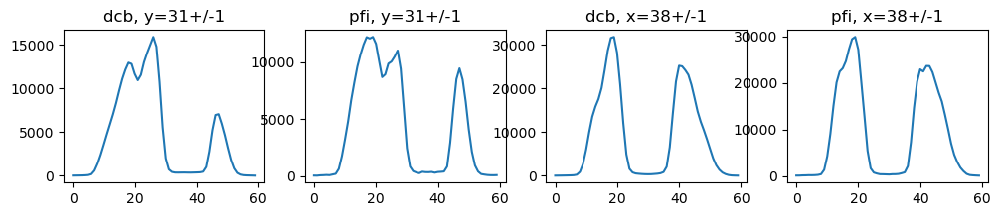

In [34]:
def mk_interp_dcb_spot(dcb_spot, pfi_spot, offset, size=60):
    im = galsim.Image(dcb_spot, copy=True, scale=1)
    im.setCenter(0,0)
    interp = galsim._InterpolatedImage(im, x_interpolant=galsim.Lanczos(5,True))
    interp_real = interp.drawImage(nx=size, ny=size, scale=1, offset=list(-np.array(offset))).array
    return interp_real * np.sum(pfi_spot) / np.sum(interp_real)

# results
divisions = []

for i in range(len(ims)):
    single_number = ims[i,0]
    print('single_number =', single_number)
    
    # rough detector position
    x, y = list(ims_det_pos[i])
    
    # initialization
    dcb_spot = ims[i,1]
    pfi_spot = ims[i,2]
    offset = [np.inf, np.inf]
    step_x, step_y = np.inf, np.inf
    itern = 0
    
    # centering iteration
    while((abs(offset[0]) > 1e-2 or abs(offset[1]) > 1e-2) and (step_x > 2e-3 or step_y > 2e-3) and itern < 10):
        itern += 1
        
        dcb_xcut = np.mean(dcb_spot[y-1:y+2,:], axis=0)
        pfi_xcut = np.mean(pfi_spot[y-1:y+2,:], axis=0)
        dcb_ycut = np.mean(dcb_spot[:,x-1:x+2], axis=1)
        pfi_ycut = np.mean(pfi_spot[:,x-1:x+2], axis=1)

        dcb_xcut = interp1d(range(60), dcb_xcut, kind='cubic')
        pfi_xcut = interp1d(range(60), pfi_xcut, kind='cubic')
        dcb_ycut = interp1d(range(60), dcb_ycut, kind='cubic')
        pfi_ycut = interp1d(range(60), pfi_ycut, kind='cubic')

        x_init = x
        y_init = y
        dx = 1e-3
        dy = 1e-3

        dcb_xmax = np.max(dcb_xcut(range(60)))
        pfi_xmax = np.max(pfi_xcut(range(60)))
        dcb_ymax = np.max(dcb_ycut(range(60)))
        pfi_ymax = np.max(pfi_ycut(range(60)))

        dcb_det_left = x_init
        while(dcb_xcut(dcb_det_left) < dcb_xmax/4. and dcb_det_left > 0):
            dcb_det_left -= dx

        dcb_det_right = x_init
        while(dcb_xcut(dcb_det_right) < dcb_xmax/4. and dcb_det_right < 60):
            dcb_det_right += dx

        pfi_det_left = x_init
        while(pfi_xcut(pfi_det_left) < pfi_xmax/4. and pfi_det_left > 0):
            pfi_det_left -= dx

        pfi_det_right = x_init
        while(pfi_xcut(pfi_det_right) < pfi_xmax/4. and pfi_det_right < 60):
            pfi_det_right += dx

        dcb_det_bottom = y_init
        while(dcb_ycut(dcb_det_bottom) < dcb_ymax/4. and dcb_det_bottom > 0):
            dcb_det_bottom -= dy

        dcb_det_top = y_init
        while(dcb_ycut(dcb_det_top) < dcb_ymax/4. and dcb_det_top < 60):
            dcb_det_top += dy

        pfi_det_bottom = y_init
        while(pfi_ycut(pfi_det_bottom) < pfi_ymax/4. and pfi_det_bottom > 0):
            pfi_det_bottom -= dy

        pfi_det_top = y_init
        while(pfi_ycut(pfi_det_top) < pfi_ymax/4. and pfi_det_top < 60):
            pfi_det_top += dy

        temp_x, temp_y = offset
        offset = [np.round(np.mean([dcb_det_right - pfi_det_right, dcb_det_left - pfi_det_left]), decimals=7),
                  np.round(np.mean([dcb_det_top - pfi_det_top, dcb_det_bottom - pfi_det_bottom]), decimals=7)]
        step_x, step_y = abs(temp_x - offset[0]), abs(temp_y - offset[1])
        
        print('iteration =', itern)
        print('offset(DCB-PFI) = ', offset)

        dcb_spot = mk_interp_dcb_spot(dcb_spot, pfi_spot, offset)

    divisions.append(pfi_spot/dcb_spot)

    plt.figure(figsize=(12,2))
    plt.subplot(141)
    plt.plot(range(60), dcb_xcut(range(60)))
    plt.title('dcb, y='+str(y)+'+/-1')

    plt.subplot(142)
    plt.plot(range(60), pfi_xcut(range(60)))
    plt.title('pfi, y='+str(y)+'+/-1')

    plt.subplot(143)
    plt.plot(range(60), dcb_ycut(range(60)))
    plt.title('dcb, x='+str(x)+'+/-1')

    plt.subplot(144)
    plt.plot(range(60), pfi_ycut(range(60)))
    plt.title('pfi, x='+str(x)+'+/-1')
    plt.show()

divisions = np.array(divisions)

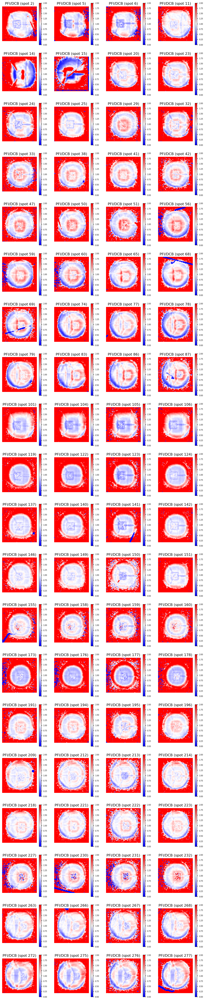

In [35]:
plt.figure(figsize=(12,60))
for i in range(len(ims)):
    plt.subplot(20,4,i+1)
    plt.imshow(divisions[i], origin='lower', cmap='bwr', vmax=2, vmin=0)
    plt.title('PFI/DCB (spot %d)' % ims[i,0], fontsize=12)
    plt.axis('off')
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=6)
plt.show()